In [1]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from scipy.io import loadmat
from skimage.filters import threshold_otsu
import cv2
from sklearn.cluster import KMeans
from sklearn import mixture
import scipy.stats as stats
from skimage import data
from skimage.morphology import disk
from skimage.filters import median, gaussian
from skimage.filters.rank import entropy

In [2]:
from deepcardio_utils import *

## Sparks location and image list

In [3]:
mat = loadmat(os.path.join(os.path.join(DATASETS_PATH, IMAGE_ID), MAT_PATH))['xytspark']
sparksDF = pd.DataFrame(mat, columns=['x','y','tIni','tFin'])
sparksDF.head()

,x,y,tIni,tFin
0,71,36,2,37
1,76,37,37,77
2,162,23,81,116
3,207,26,117,152
4,187,10,333,383


In [4]:
imageList = sorted(os.listdir(IMAGE_FOLDER))
imageList[:5]

['170215_RyR-GFP30_01_Serie2_Sparks.mat',
 '170215_RyR-GFP30_RO_01_Serie2_z10000_ch01.tif',
 '170215_RyR-GFP30_RO_01_Serie2_z10001_ch01.tif',
 '170215_RyR-GFP30_RO_01_Serie2_z10002_ch01.tif',
 '170215_RyR-GFP30_RO_01_Serie2_z10003_ch01.tif']

## Plot images and locate sparks

In [5]:
idx = 130
im = get_image_array(idx)
im.shape

(40, 256)

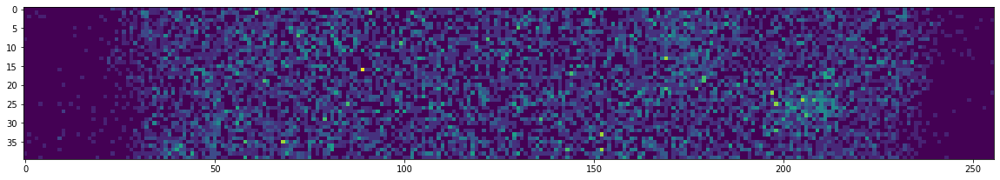

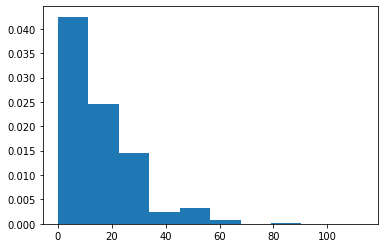

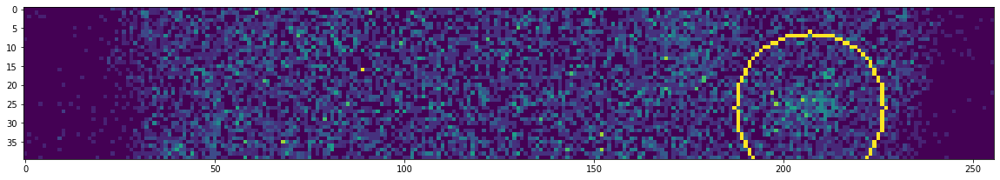

In [6]:
plt.figure(figsize=(20, 10))
plt.imshow(im)
plt.show()

plt.hist(im.flatten(), density=True)
plt.show()

# find spark
im_ = im.copy()
sparkLocation = get_spark_location(sparksDF, idx)
plt.figure(figsize=(20, 10))
color = int(im_.max())
plt.imshow(cv2.circle(im_, (sparkLocation['x'], sparkLocation['y']), 20, color, thickness=1, lineType=8, shift=0))
plt.show()

## Mask on the spark

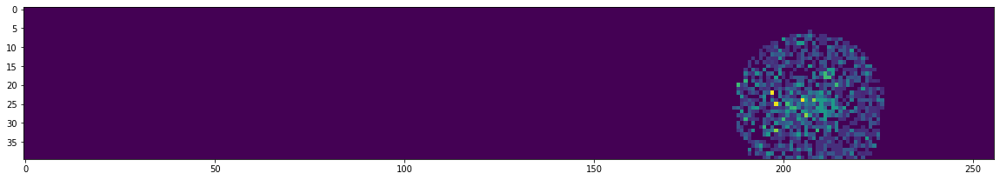

In [7]:
idx = 130
im = get_image_array(idx)
sparkLocation = get_spark_location(sparksDF, idx)
sparkLocation = sparkLocation.loc[sparkLocation.index[0]]
mask = get_mask(im.shape[0], im.shape[1], sparkLocation['x'], sparkLocation['y'], 20)
im[mask == False]=0

plt.figure(figsize=(20, 10))
plt.imshow(im)
plt.show()

## Spark highlight

### Binary threshold: arbitrary vs otsu

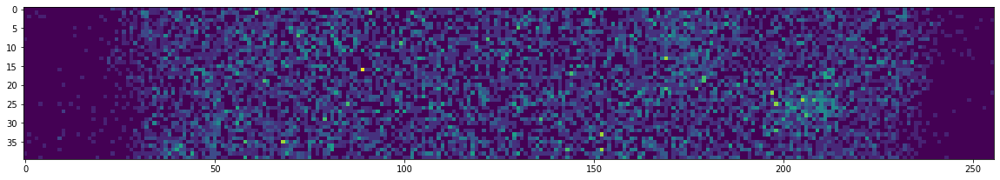

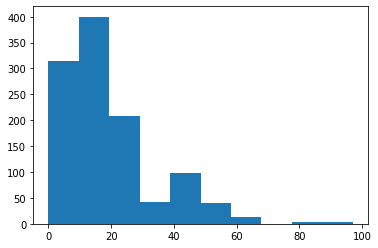

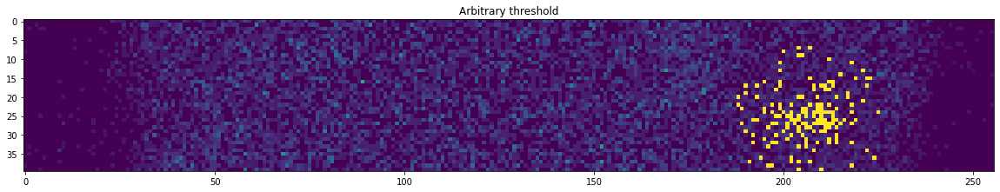

otsu threshold: 16


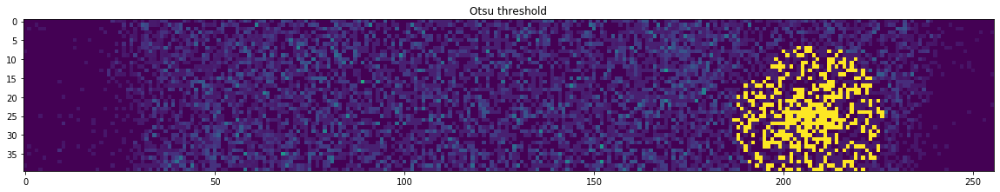

array([ 0, 11, 13, 16, 23, 26, 32, 34, 40, 46, 48, 53, 64, 67, 80, 94, 97],
      dtype=uint8)

In [8]:
idx = 130
im = get_image_array(idx)
im.shape
sparkLocation = get_spark_location(sparksDF, idx)
sparkLocation = sparkLocation.loc[sparkLocation.index[0]]

plt.figure(figsize=(20, 10))
plt.imshow(im)
plt.show()

mask = get_mask(im.shape[0], im.shape[1], sparkLocation['x'], sparkLocation['y'], 20)

# arbitrary
plt.hist(im[mask].flatten())
plt.show()

im_ = im.copy()
im_[mask] = np.where(im_[mask]>35, 3000, im_[mask])
plt.figure(figsize=(20, 10))
plt.imshow(im_)
plt.title('Arbitrary threshold')
plt.show()

# otsu
otsu = threshold_otsu(im[mask].flatten())
print(f"otsu threshold: {otsu}")

im_ = im.copy()
im_[mask] = np.where(im_[mask]>otsu, 3000, im_[mask])
plt.figure(figsize=(20, 10))
plt.imshow(im_)
plt.title('Otsu threshold')
plt.show()

np.unique(im[mask].flatten())

### KMeans

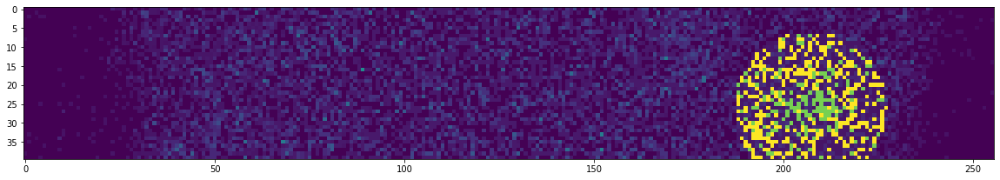

In [9]:
idx = 130
im = get_image_array(idx)
sparkLocation = get_spark_location(sparksDF, idx)
sparkLocation = sparkLocation.loc[sparkLocation.index[0]]
mask = get_mask(im.shape[0], im.shape[1], sparkLocation['x'], sparkLocation['y'], 20)

k = KMeans(n_clusters=3).fit(im[mask].reshape(-1,1))
im[mask] = np.where(k.labels_==k.labels_[im[mask].argmax()], 3000, im[mask])
im[mask] = np.where(k.labels_==k.labels_[im[mask].argmin()], 1000, im[mask])

plt.figure(figsize=(20, 10))
plt.imshow(im)
plt.show()

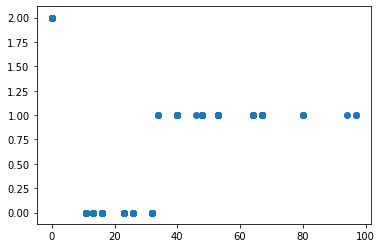

In [10]:
idx = 130
im = get_image_array(idx)
plt.scatter(im[mask].flatten(), k.labels_)
plt.show()

### Gaussian Mixture Models (GMM)

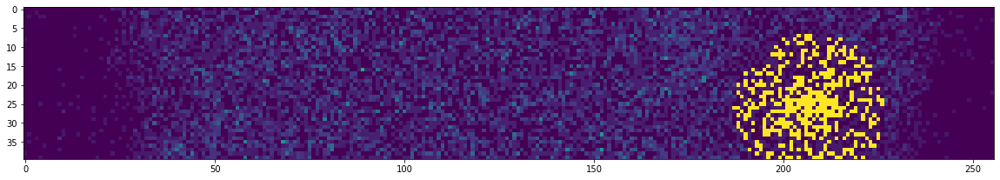

In [11]:
idx = 130
im = get_image_array(idx)
sparkLocation = get_spark_location(sparksDF, idx)
sparkLocation = sparkLocation.loc[sparkLocation.index[0]]
mask = get_mask(im.shape[0], im.shape[1], sparkLocation['x'], sparkLocation['y'], 20)

gmm = mixture.GaussianMixture(n_components=3).fit(im[mask].reshape(-1,1))
lab = gmm.predict(im[mask].reshape(-1,1))
im[mask] = np.where(lab==lab[im[mask].argmax()], 3000, im[mask])

plt.figure(figsize=(20, 10))
plt.imshow(im)
plt.show()

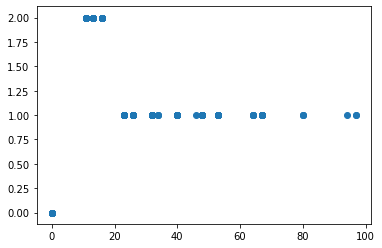

In [12]:
idx = 130
im = get_image_array(idx)
plt.scatter(im[mask].flatten(), lab)
plt.show()

### GMM with optimal BIC number

[9466.05435759548, 9301.741713154739, 3863.803140915015, 95.29609475422994, 1728.3241758126758, 91.36003612791133, 1291.091787919013, 1301.8901059137995, -201.56195792493259, -254.88218953524787]
...and the winner is GMM model G = 6


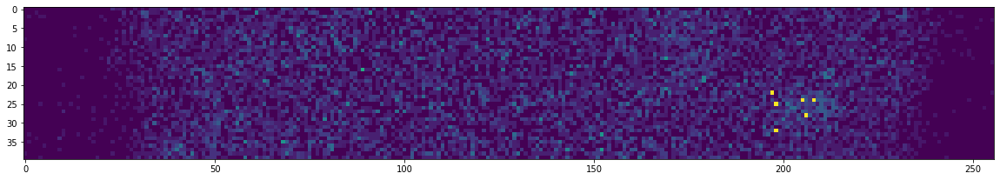

In [13]:
idx = 130
im = get_image_array(idx)
sparkLocation = get_spark_location(sparksDF, idx)
sparkLocation = sparkLocation.loc[sparkLocation.index[0]]
mask = get_mask(im.shape[0], im.shape[1], sparkLocation['x'], sparkLocation['y'], 20)

#calcula el BIC per trobar el número de gaussianes òptim
NMAX = 10
bic = []
aic = []

for kG in np.arange(1,NMAX+1):
    gmm = mixture.GaussianMixture(n_components=kG).fit(im[mask].reshape(-1,1))
    bic.append(gmm.bic(im[mask].reshape(-1,1))) #cada cop va afegint el bic amb kG+1, així ho tens tot en un vector i pots calcualr el mínim

print(bic)

idx_winner = np.argmin(np.abs(bic))
print('...and the winner is GMM model G = {}'.format(idx_winner+1))

gmm = mixture.GaussianMixture(n_components=(idx_winner+1)).fit(im[mask].reshape(-1,1))
lab = gmm.predict(im[mask].reshape(-1,1))
im[mask] = np.where(lab==lab[im[mask].argmax()], 3000, im[mask])

plt.figure(figsize=(20, 10))
plt.imshow(im)
plt.show()

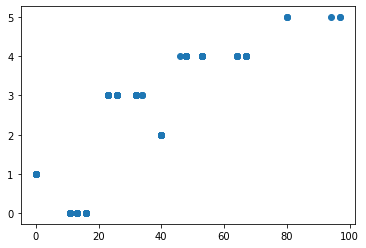

In [14]:
idx = 130
im = get_image_array(idx)
plt.scatter(im[mask].flatten(), lab)
plt.show()

### Using distance info

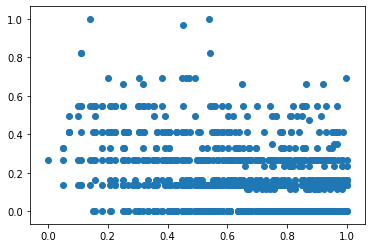

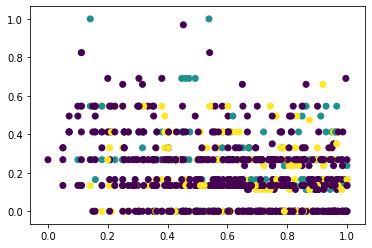

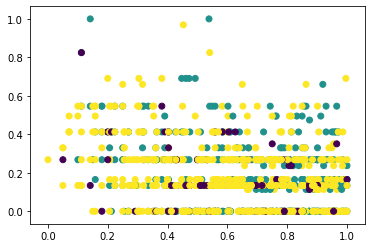

In [15]:
idx = 130
im = get_image_array(idx)
sparkLocation = get_spark_location(sparksDF, idx)
sparkLocation = sparkLocation.loc[sparkLocation.index[0]]
mask = get_mask(im.shape[0], im.shape[1], sparkLocation['x'], sparkLocation['y'], 20)

y, x = np.ogrid[:im.shape[0], :im.shape[1]]
dist_from_center = np.sqrt((x - sparkLocation['x'])**2 + (y-sparkLocation['y'])**2)
aux = np.array([dist_from_center[mask].flatten(), im[mask].flatten()])
aux[0] /= aux[0].max()
aux[1] /= aux[1].max()

plt.scatter(aux[0], aux[1])
plt.show()

km = KMeans(n_clusters=3).fit(aux.reshape(-1,2))
plt.scatter(aux[0], aux[1], c=km.labels_)
plt.show()

gmm = mixture.GaussianMixture(n_components=3).fit(aux.reshape(-1, 2))
lab = gmm.predict(aux.reshape(-1, 2))
plt.scatter(aux[0], aux[1], c=lab)
plt.show()

### Combine plot image and spark segmentation

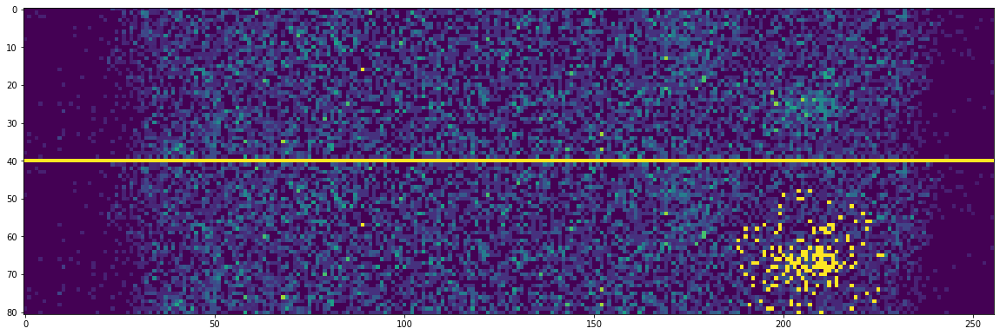

In [16]:
idx = 130
im = get_image_array(idx)
im_ = im.copy()
k = KMeans(n_clusters=3).fit(im_[mask].reshape(-1,1))
im_[mask] = np.where(k.labels_==k.labels_[im_[mask].argmax()], im.max(), im_[mask])

conc_im = np.concatenate((im, np.full((1,im.shape[1]), im_.max()), im_))
plt.figure(figsize=(20,10))
plt.imshow(conc_im)
plt.show()

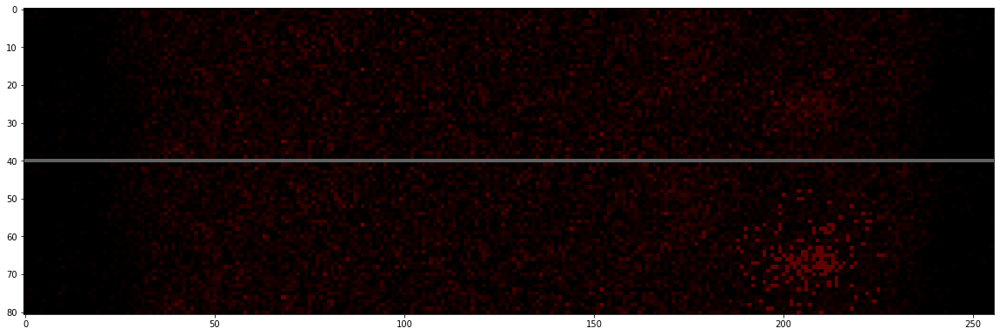

In [17]:
idx = 130
im = cv2.imread(get_image_path(idx))
im_ = im.copy()

sparkLocation = get_spark_location(sparksDF, idx)
sparkLocation = sparkLocation.loc[sparkLocation.index[0]]
mask = get_mask(im.shape[0], im.shape[1], sparkLocation['x'], sparkLocation['y'], 20)

k = KMeans(n_clusters=3).fit(im_[mask].reshape(-1,3))
maxRValue = im_[mask,2].max()
maxValue = np.array([0, 0, maxRValue]).reshape(-1,3)
maxValueIdx = im_[mask, 2].argmax()
isSparkCond = np.full(im_[mask].shape, False)
isSparkCond[k.labels_ == k.labels_[maxValueIdx], 2] = True
im_[mask] = np.where(isSparkCond, maxRValue, im_[mask])

conc_im = np.concatenate((im, np.full((1,im.shape[1], 3), maxRValue), im_))
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(conc_im, cv2.COLOR_BGR2RGB))
plt.show()

### savefig spark frames KMeans

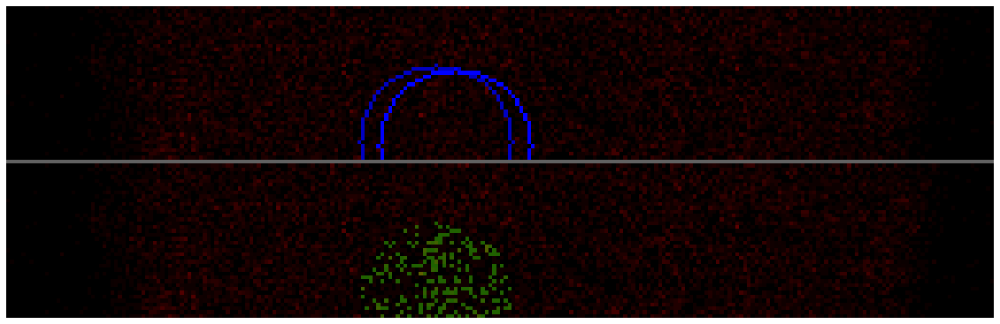

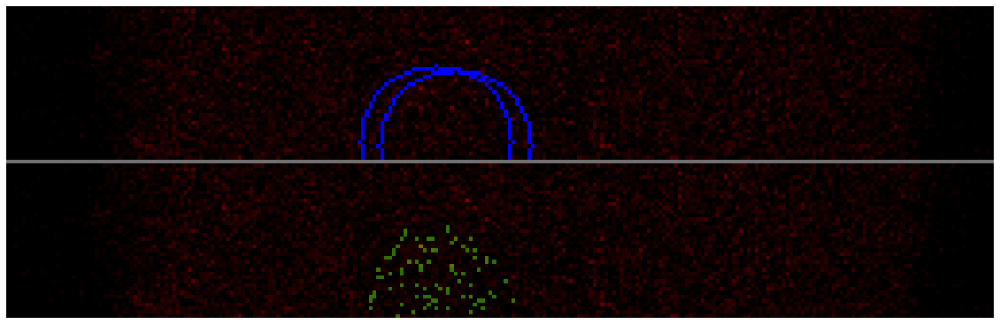

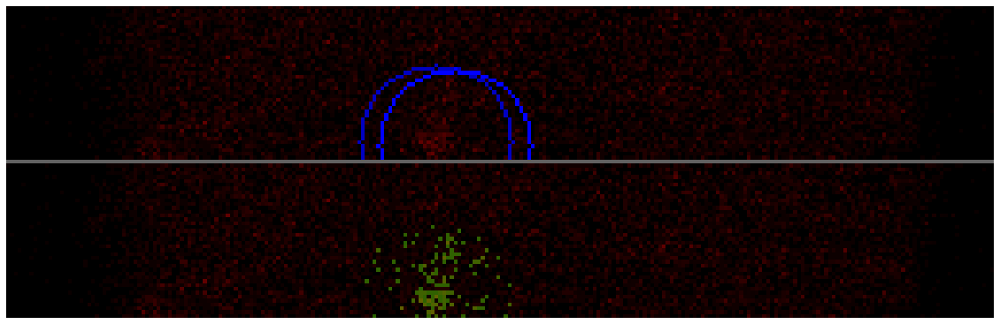

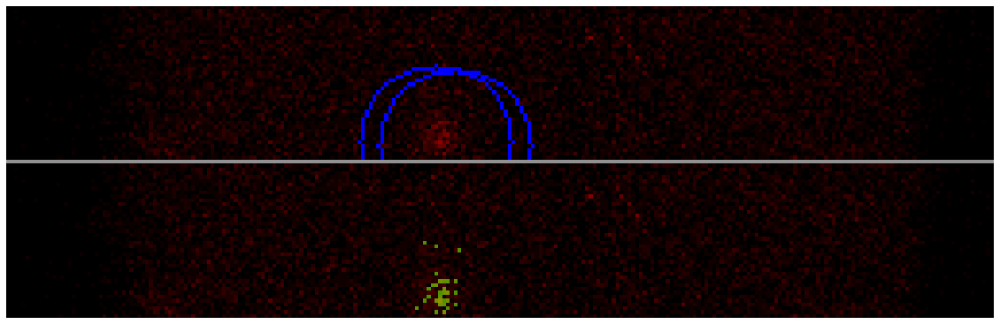

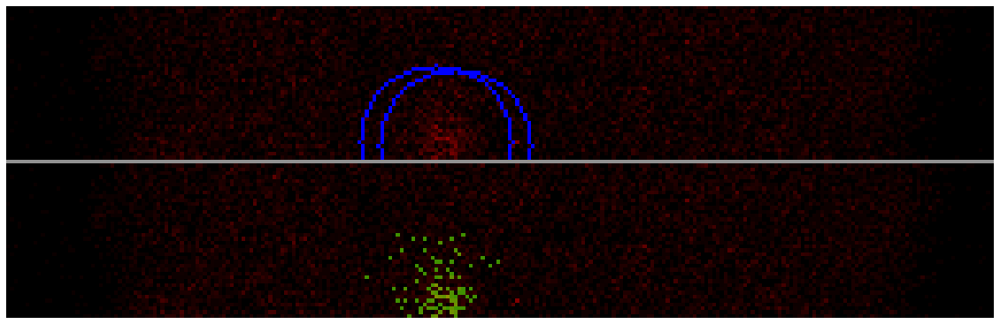

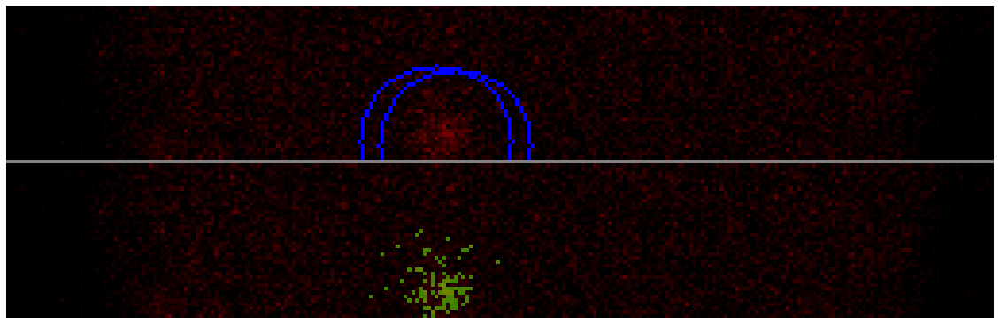

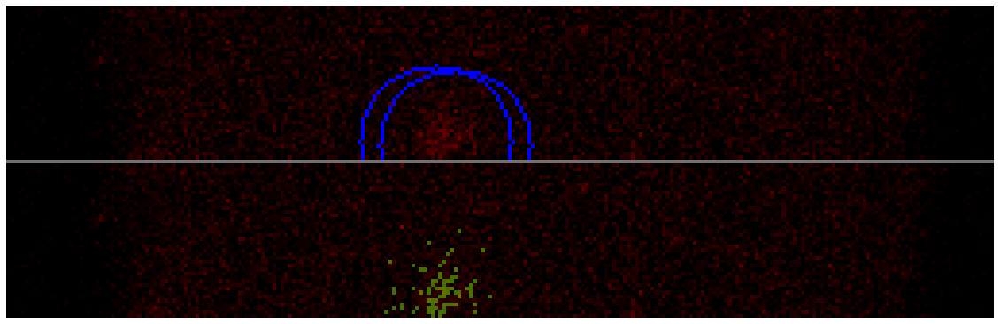

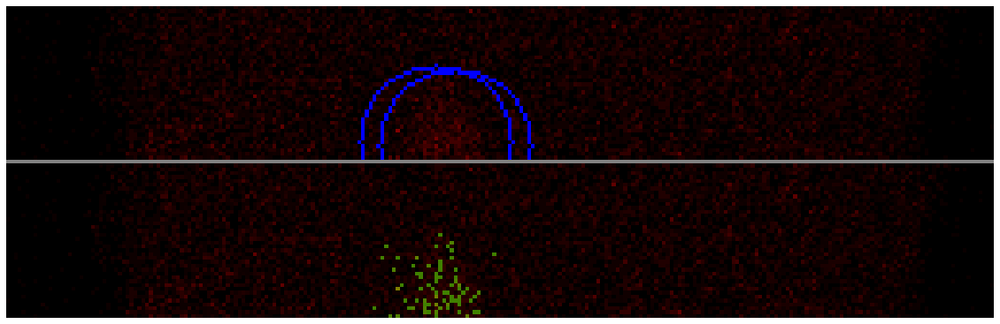

In [18]:
idx = 2008
for idx in range(2003, 2010+1):
    im = cv2.imread(get_image_path(idx))
    im_ = im.copy()

    sparkLocations = get_spark_location(sparksDF, idx)
    for i, sparkLocation in sparkLocations.iterrows():
        color = int(im.max()*2)
        cv2.circle(im, (sparkLocation['x'], sparkLocation['y']), 20, color, thickness=1, lineType=8, shift=0)

        mask = get_mask(im.shape[0], im.shape[1], sparkLocation['x'], sparkLocation['y'], 20)

        k = KMeans(n_clusters=3).fit(im_[mask].reshape(-1,3))
        maxRValue = im_[mask,2].max()
        maxValue = np.array([0, 0, maxRValue]).reshape(-1,3)
        maxValueIdx = im_[mask, 2].argmax()
        isSparkCond = np.full(im_[mask].shape, False)
        isSparkCond[k.labels_ == k.labels_[maxValueIdx], 1] = True
        im_[mask] = np.where(isSparkCond, maxRValue, im_[mask])

    conc_im = np.concatenate((im, np.full((1,im.shape[1], 3), maxRValue), im_))
    plt.figure(figsize=(20,10))
    plt.imshow(cv2.cvtColor(conc_im, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    # plt.title(f"{idx}")
    # plt.savefig(f"_out/spark{idx}", bbox_inches = 'tight', pad_inches = 0)
    plt.show()

### Use BIC for the number of mixtures

[[ 0.          0.         35.15074162]
 [ 0.          0.         16.        ]
 [ 0.          0.          0.        ]]


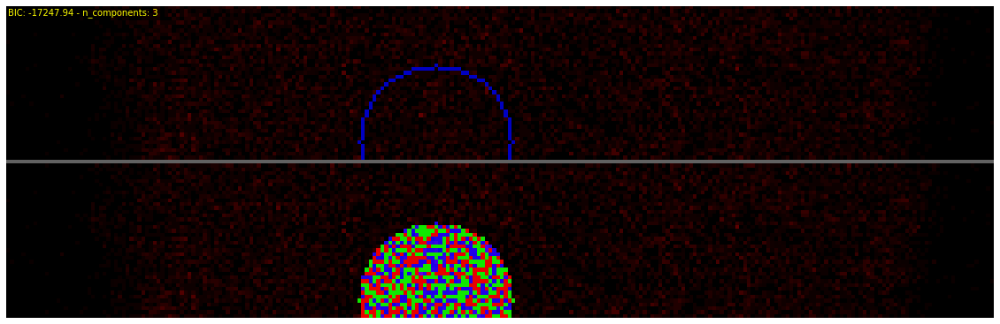

[[ 0.          0.          0.        ]
 [ 0.          0.         53.72585777]
 [ 0.          0.         20.19818268]]


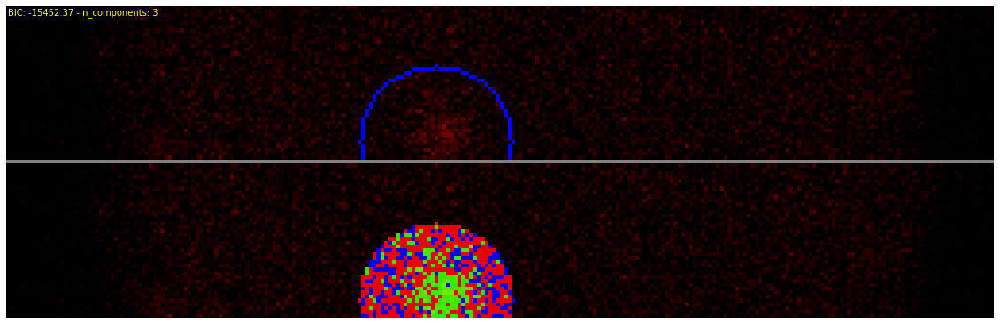

In [19]:
for idx in [2003, 2008]:
    im = cv2.imread(get_image_path(idx))
    im_ = im.copy()

    sparkLocations = get_spark_location(sparksDF, idx)
    gmmCounts = []
    # only first one
    i, sparkLocation = next(sparkLocations.iterrows())
    color = int(im.max()*2)

    mask = get_mask(im.shape[0], im.shape[1], sparkLocation['x'], sparkLocation['y'], 20)
    
    nComp, bic = get_optimal_ncomponents_and_bic_gmm(im[mask].reshape(-1,3), nmin=1, nmax=3)
    nComp = 3
    gmmCounts.append(nComp)
    gmm = mixture.GaussianMixture(n_components=nComp).fit(im[mask].reshape(-1,3))
    lab = gmm.predict(im[mask].reshape(-1,3))
    
    print(gmm.means_)

    maxRValue = im_[mask,2].max()
    maxValue = np.array([0, 0, maxRValue]).reshape(-1,3)
    maxValueIdx = im_[mask, 2].argmax()
    isSparkCond = np.full(im_[mask].shape, False)
    isSparkCond[lab == lab[maxValueIdx], 1] = True
    # im_[mask] = np.where(isSparkCond, maxRValue, im_[mask])
    im_[mask, lab%3]  = 1000 * (lab//3+1)

    cv2.circle(im, (sparkLocation['x'], sparkLocation['y']), 20, color, thickness=1, lineType=8, shift=0)
    conc_im = np.concatenate((im, np.full((1,im.shape[1], 3), maxRValue), im_))
    plt.figure(figsize=(20,10))
    plt.imshow(cv2.cvtColor(conc_im, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    # plt.title(f"{idx}")
    plt.text(0, 0, f"BIC: {round(bic,2)} - n_components: {', '.join(str(c) for c in gmmCounts)}", c='yellow', verticalalignment='top')
    plt.savefig(f"_out/sparkDetection{idx}_autoGMMnum", bbox_inches = 'tight', pad_inches = 0)
    plt.show()

### Utilitzar pixels amb valor 0 vs no utilitzarlos

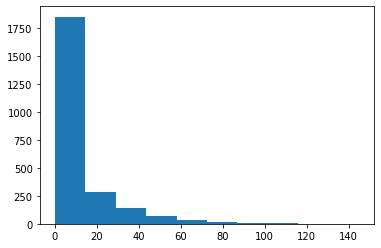

[ 0.         47.89976864 16.         86.04410918 32.        ] [0.28322957 0.17068083 0.33415957 0.04175038 0.17017964] [1.00000000e-06 3.08421423e+02 1.00000000e-06 7.48676540e+02
 1.00000000e-06]


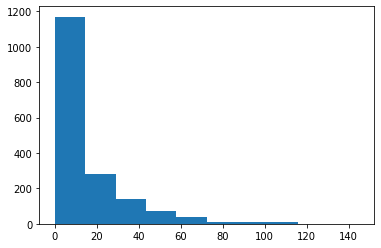

[ 31.51702354  96.28739434  48.          15.83157896  66.63121814
 116.96371854] [0.25823276 0.01315922 0.12304936 0.49393414 0.09363871 0.01798581] [2.66716226e+00 1.63001115e+00 1.00000000e-06 4.76898484e-01
 6.84518023e+01 1.20196241e+02]


In [20]:
idx=2006

im = cv2.imread(get_image_path(idx))
im_ = im.copy()

mask = get_mask(im.shape[0], im.shape[1], sparkLocation['x'], sparkLocation['y'], 20)

# tots els pixels
plt.hist(im[mask].flatten())
plt.show()

sparkLocations = get_spark_location(sparksDF, idx)
# only first one
i, sparkLocation = next(sparkLocations.iterrows())

nComp, bic = get_optimal_ncomponents_and_bic_gmm(im[mask].reshape(-1,1))

gmm = mixture.GaussianMixture(n_components=nComp).fit(im[mask].reshape(-1,3))
lab = gmm.predict(im[mask].reshape(-1,3))

print(gmm.means_[:, 2], gmm.weights_, gmm.covariances_[:, 2, 2])


# nomes pixels > 0
mask = mask & (im[:,:,2]>0)
plt.hist(im[mask].flatten())
plt.show()

sparkLocations = get_spark_location(sparksDF, idx)
# only first one
i, sparkLocation = next(sparkLocations.iterrows())

nComp, bic = get_optimal_ncomponents_and_bic_gmm(im[mask].reshape(-1,1))

gmm = mixture.GaussianMixture(n_components=nComp).fit(im[mask].reshape(-1,3))
lab = gmm.predict(im[mask].reshape(-1,3))

print(gmm.means_[:, 2], gmm.weights_, gmm.covariances_[:, 2, 2])

### Determine when the spark is visible with BIC

The idea is to use the BIC of the GMM model, used to segment the pixels of the spark, to determine in which frames the spark is more visible. To do it the bic of the best GMM model (various n_components are tried for each frame) is stored in bics_list, and then another GMM is applied to this list (with optimal n_components number as well). The cluster containing the best bic will be the one where the spark is more visible.

/Users/aleixsacrest/opt/anaconda3/envs/ia373v/lib/python3.7/site-packages/sklearn/mixture/_base.py:147: ConvergenceWarning: Number of distinct clusters (9) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  random_state=random_state).fit(X).labels_


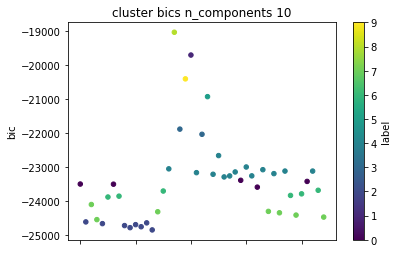

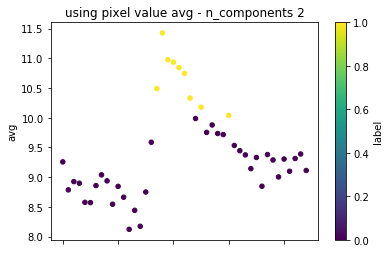

In [21]:
sparkS = sparksDF.loc[26, :]
bics_list = []
value_mean_list = []
gmmCounts = []

for idx in range(sparkS['tIni'], sparkS['tFin']):
    im = cv2.imread(get_image_path(idx))
    im_ = im.copy()

    mask = get_mask(im.shape[0], im.shape[1], sparkS['x'], sparkS['y'], 20)
    nComp, bic = get_optimal_ncomponents_and_bic_gmm(im[mask].reshape(-1,1), nmin=2)
    gmmCounts.append(nComp)
    
    bics_list.append(round(bic,2))
    value_mean_list.append(im[mask & (im[:,:,2]>0)].reshape(-1,1).mean())

bics = np.array(bics_list).reshape(-1, 1)
# k = KMeans(n_clusters=2).fit(bics)
nComp, bic = get_optimal_ncomponents_and_bic_gmm(bics, nmin=2)

gmm = mixture.GaussianMixture(n_components=nComp).fit(bics)
visibilityLabels = gmm.predict(bics)
visLabel = visibilityLabels[np.argmin(bics)]
df = pd.DataFrame([bics_list, visibilityLabels], index=['bic', 'label']).T.reset_index()
df.plot.scatter(x='index', y='bic', c='label', cmap='viridis')
plt.title(f"cluster bics n_components {nComp}")
plt.show()

kk = np.array(value_mean_list).reshape(-1,1)
nComp, bic = get_optimal_ncomponents_and_bic_gmm(kk, nmin=2)
gmm = mixture.GaussianMixture(n_components=nComp).fit(kk)
avgLabels = gmm.predict(kk)
df = pd.DataFrame([value_mean_list, avgLabels], index=['avg', 'label']).T.reset_index()
df.plot.scatter(x='index', y='avg', c='label', cmap='viridis')
plt.title(f"using pixel value avg - n_components {nComp}")
plt.show()

### Using the pixel value avg to determine spark real presence

- predict_proba per veure la probabilitat de cada gaussiana
- inici de spark amb canvi sobtat de valor

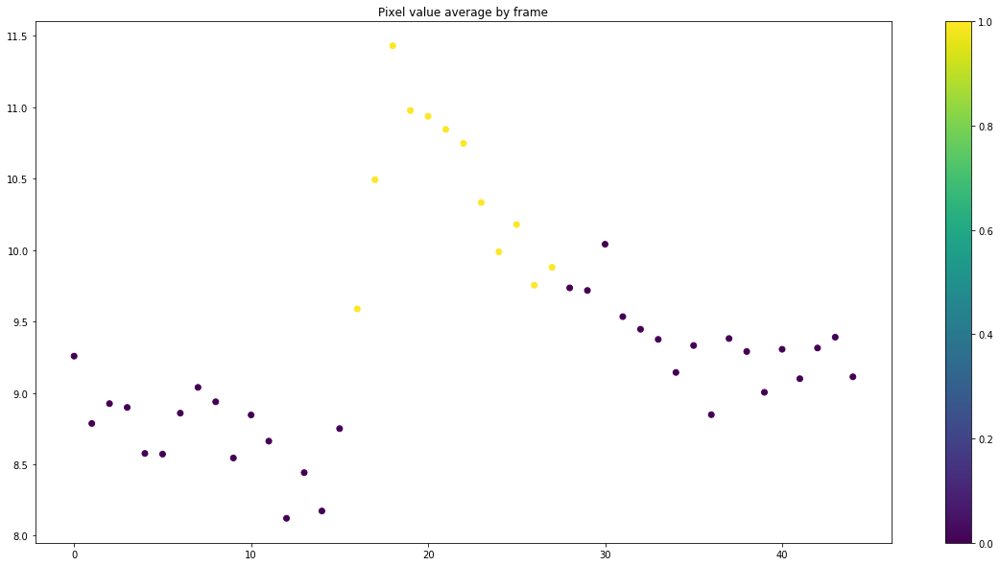

In [22]:
sparkIni, sparkFin, sparkX, sparkY = sparksDF.loc[26, 'tIni'], sparksDF.loc[26, 'tFin'], sparksDF.loc[26, 'x'], sparksDF.loc[26, 'y']

def get_spark_visibility_frame_mask(sparkIni, sparkFin, sparkX, sparkY):
    meansList = []
    for idx in range(sparkIni, sparkFin):
        im = cv2.imread(get_image_path(idx))
        im_ = im.copy()

        mask = get_mask(im.shape[0], im.shape[1], sparkX, sparkY, 20)
        meansList.append(im[mask & (im[:,:,2]>0)].reshape(-1,1).mean())

    # get first frame of spark
    meanS = pd.Series(meansList)
    deltaS = (meanS-meanS.cummax().shift())
    firstFrameCand = (deltaS>0) & (deltaS > deltaS.cummax().shift()*2)
    pd.concat([meanS, deltaS, firstFrameCand], axis=1).rename(columns=dict(enumerate(['mean', 'delta', 'firstFrameCand'])))
    initFrameIdx = firstFrameCand.argmax()

    # use gmm on avg pixel value to detect spark
    aux = np.array(meansList).reshape(-1, 1)
    nComp, bic = get_optimal_ncomponents_and_bic_gmm(aux, nmin=2)
    gmm = mixture.GaussianMixture(n_components=nComp).fit(aux)
    avgLabels = gmm.predict(aux)

    sparkMixtureIdx = gmm.means_.argmax()
    cond = avgLabels == sparkMixtureIdx

    # enlarge spark duration FROM first frame detected from deltas 
    # TO first element classified as no-spark to reappear AND which is followed by at least another no-spark
    cond = (avgLabels != sparkMixtureIdx) & (np.roll(avgLabels, -1) != sparkMixtureIdx)
    firstSparkClusterLabel = (avgLabels==sparkMixtureIdx).argmax()
    endSparkIdx = cond[firstSparkClusterLabel:].argmax() + firstSparkClusterLabel
    avgLabels = np.full(avgLabels.shape, False)
    avgLabels[initFrameIdx:endSparkIdx] = True
    
    return avgLabels

sparkVisibilityMask = get_spark_visibility_frame_mask(sparkIni, sparkFin, sparkX, sparkY)

meansList = []
for idx in range(sparkIni, sparkFin):
    im = cv2.imread(get_image_path(idx))

    mask = get_mask(im.shape[0], im.shape[1], sparkX, sparkY, 20)
    meansList.append(im[mask & (im[:,:,2]>0)].reshape(-1,1).mean())

plt.figure(figsize=(20,10))
plt.scatter(x=range(len(meansList)), y=meansList, c=sparkVisibilityMask)
plt.title('Pixel value average by frame')
plt.colorbar()
# plt.savefig(f"_out/scatter_pixel_value", bbox_inches = 'tight', pad_inches = 0)
plt.show()

# [(idx+1989, v) for idx, v in enumerate(avgLabels)]

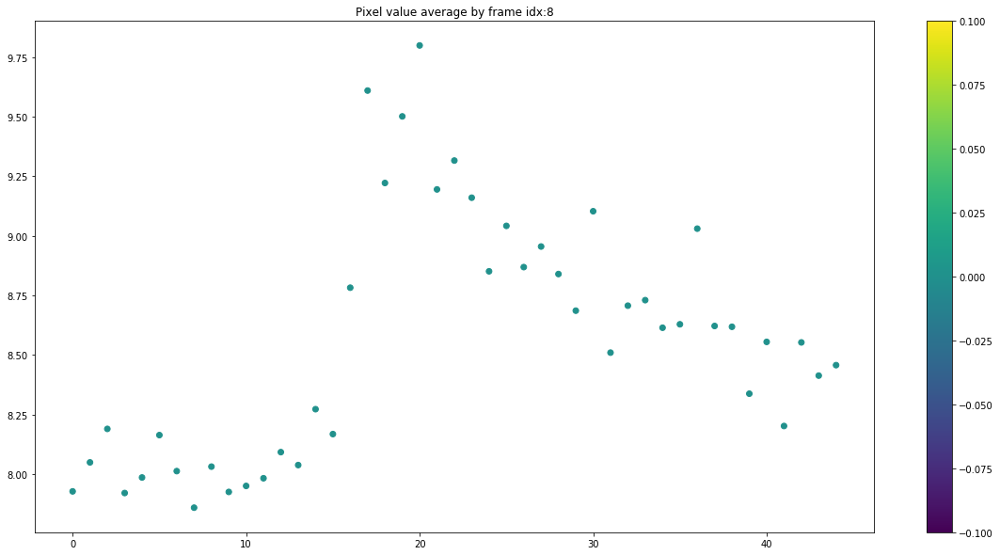

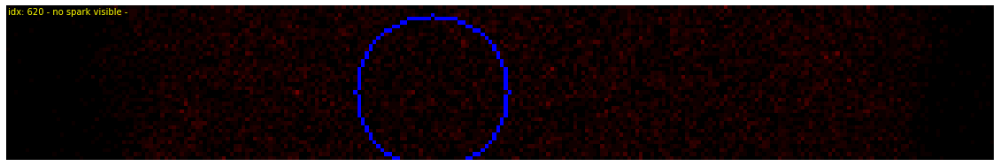

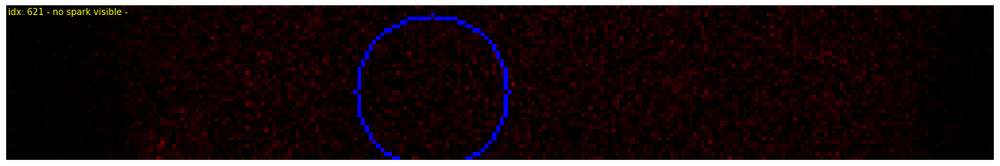

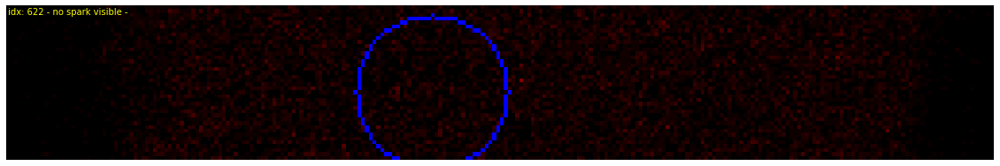

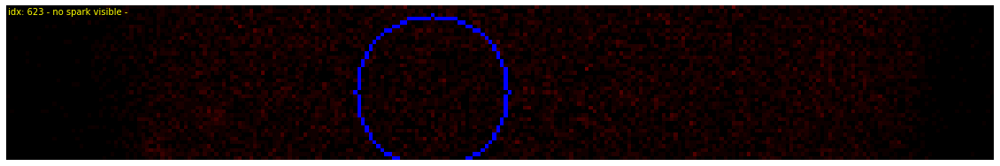

...

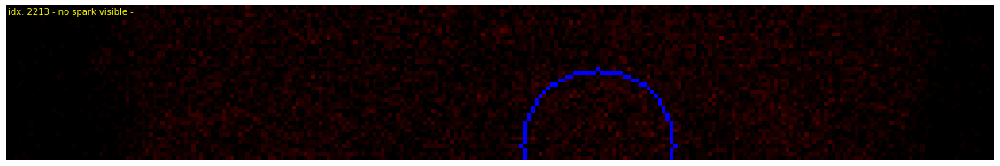

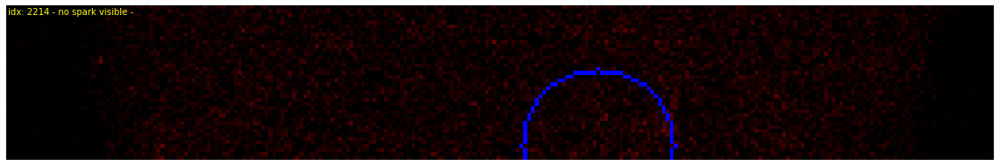

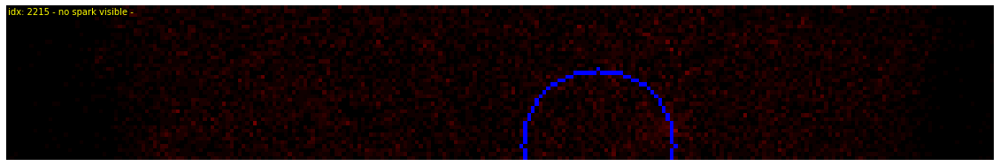

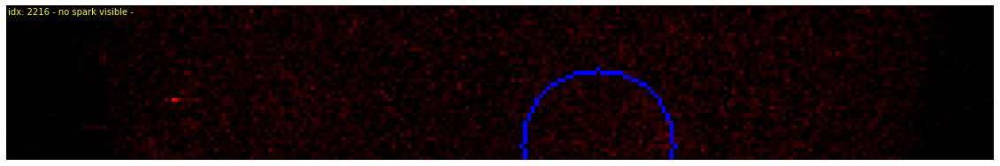

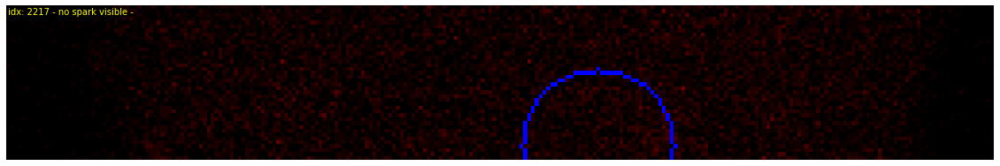

In [23]:
for sidx, sparkS in sparksDF.sample(5).iterrows():
    sparkIni = sparkS['tIni']
    sparkFin = sparkS['tFin']
    sparkX = sparkS['x']
    sparkY = sparkS['y']
    
    sparkVisibilityMask = get_spark_visibility_frame_mask(sparkIni, sparkFin, sparkX, sparkY)
    meansList = []
    for idx in range(sparkIni, sparkFin):
        im = cv2.imread(get_image_path(idx))

        mask = get_mask(im.shape[0], im.shape[1], sparkX, sparkY, 20)
        meansList.append(im[mask & (im[:,:,2]>0)].reshape(-1,1).mean())

    plt.figure(figsize=(20,10))
    plt.scatter(x=range(len(meansList)), y=meansList, c=sparkVisibilityMask)
    plt.title('Pixel value average by frame idx:{}'.format(sidx))
    plt.colorbar()
    # plt.savefig(f"_out/scatter_pixel_value", bbox_inches = 'tight', pad_inches = 0)
    plt.show()
    
    for j, idx in enumerate(range(sparkIni, sparkFin)):
        im = cv2.imread(get_image_path(idx))
        im_ = im.copy()
        
        gmmCounts = []
        # only first one

        cv2.circle(im, (sparkX, sparkY), 20, color, thickness=1, lineType=8, shift=0)
        plt.figure(figsize=(20,5))
        plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.text(0, 0, f"idx: {idx} - " +\
                 f"{'no' if not sparkVisibilityMask[j] else ''} spark visible - " +\
                 # f"probs {', '.join(predictProbaDF.loc[j].round(2).astype(str))}" +\
                 (f"n #gmms {nComp}" if sparkVisibilityMask[j] else ""), c='yellow', verticalalignment='top')
        # plt.savefig(f"_out/spark{idx}", bbox_inches = 'tight', pad_inches = 0)
        plt.show()

### Highlight spark when visible

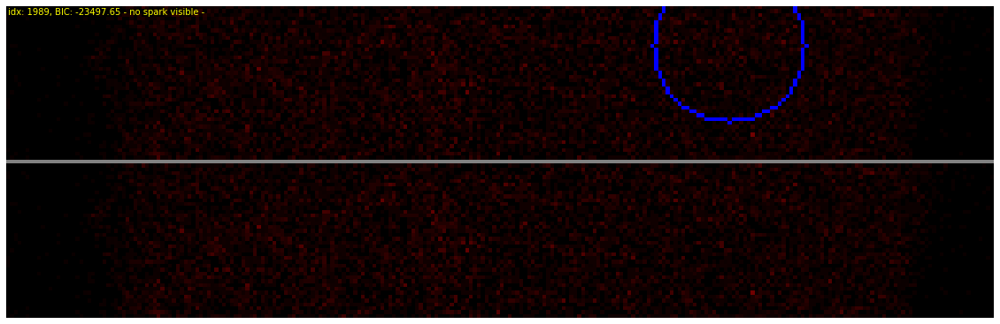

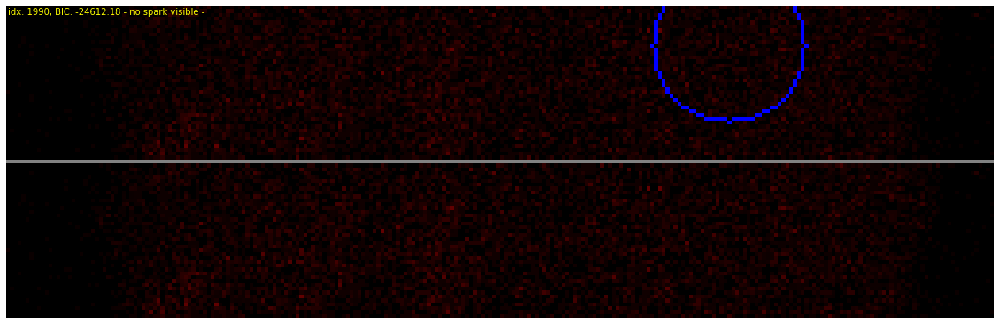

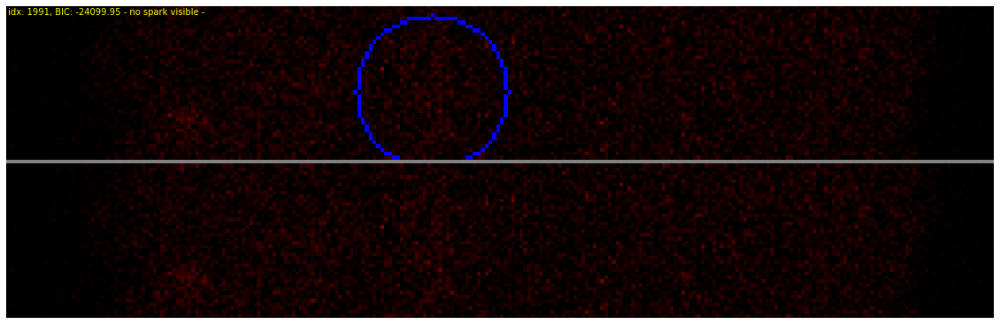

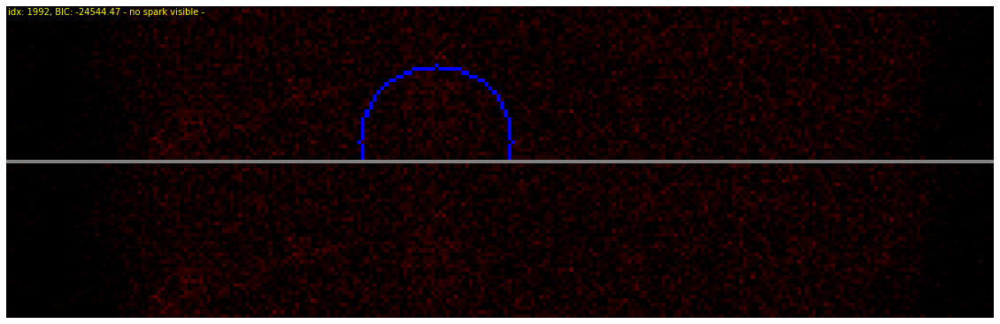

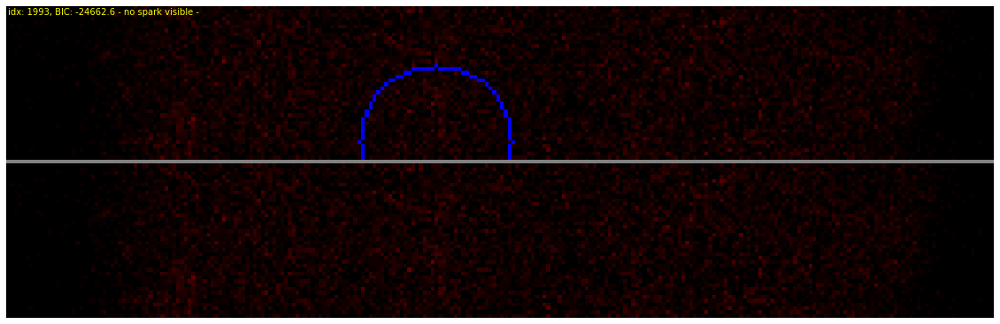

...

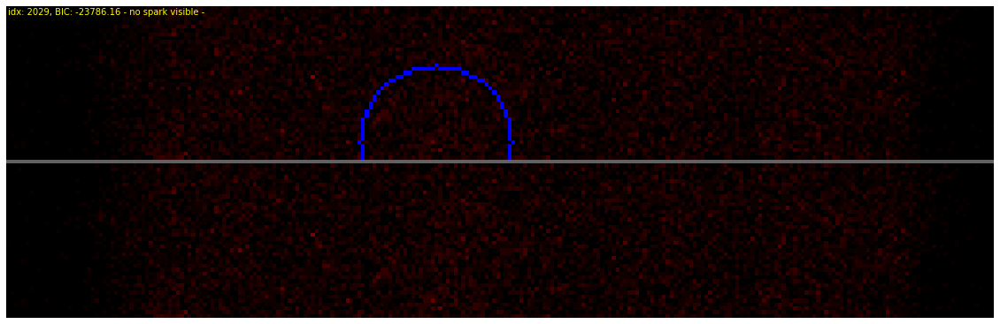

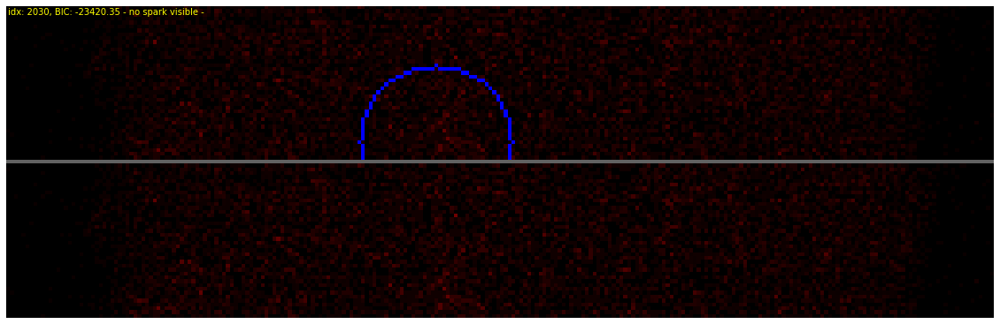

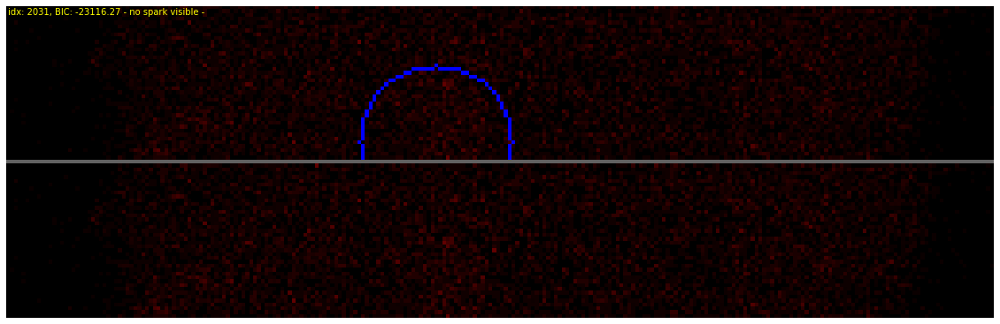

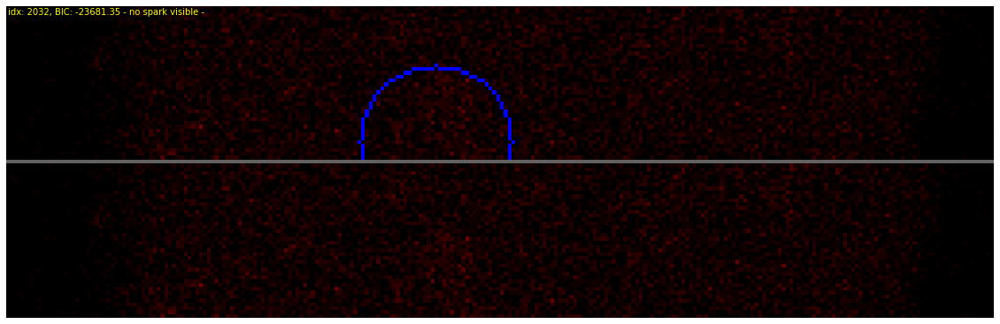

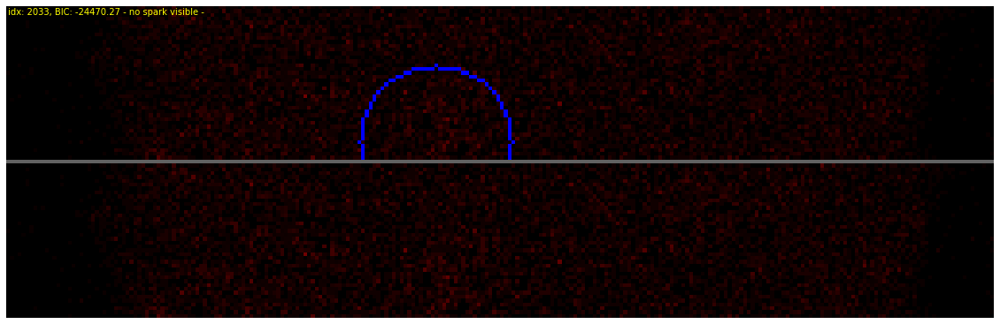

In [24]:
_, sparkS = next(sparksDF.loc[(sparksDF.loc[:, 'tIni']<=2003)&(sparksDF.loc[:, 'tFin']>=2003), :].iterrows())
sparkVisibilityMask = get_spark_visibility_frame_mask(sparkS['tIni'], sparkS['tFin'], sparkS['x'], sparkS['y'])
for j, idx in enumerate(range(sparkS['tIni'], sparkS['tFin'])):
    im = cv2.imread(get_image_path(idx))
    im_ = im.copy()

    sparkLocations = get_spark_location(sparksDF, idx)
    gmmCounts = []
    # only first one
    i, sparkLocation = next(sparkLocations.iterrows())
    
    if sparkVisibilityMask[j]:
        mask = get_mask(im.shape[0], im.shape[1], sparkLocation['x'], sparkLocation['y'], 20) & (im[:,:,2]>0)
    
        nComp, bic = get_optimal_ncomponents_and_bic_gmm(im[mask].reshape(-1,1))
        
        # nComp = 2
        gmm = mixture.GaussianMixture(n_components=nComp).fit(im[mask].reshape(-1,3))
        lab = gmm.predict(im[mask].reshape(-1,3))
        probs = gmm.predict_proba(im[mask].reshape(-1,3))
        mixtIdx = gmm.means_[:, 2].argmax()

        maxRValue = im_[mask,2].max()
        maxValue = np.array([0, 0, maxRValue]).reshape(-1,3)
        maxValueIdx = im_[mask, 2].argmax()
        isSparkCond = np.full(im_[mask].shape, False)
        isSparkCond[lab == mixtIdx, 1] = True # probs[:,mixtIdx]>.8 (amb nCom fixat (2/3)) vs lab == mixtIdx (automatic nComp)
        im_[mask] = np.where(isSparkCond, maxRValue, im_[mask])
    
    cv2.circle(im, (sparkLocation['x'], sparkLocation['y']), 20, color, thickness=1, lineType=8, shift=0)
    conc_im = np.concatenate((im, np.full((1,im.shape[1], 3), maxRValue), im_))
    plt.figure(figsize=(20,10))
    plt.imshow(cv2.cvtColor(conc_im, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.text(0, 0, f"idx: {idx}, BIC: {round(bics_list[j],2)} - " +\
             f"{'no' if not sparkVisibilityMask[j] else ''} spark visible - " +\
             # f"probs {', '.join(predictProbaDF.loc[j].round(2).astype(str))}" +\
             (f"n #gmms {nComp}" if sparkVisibilityMask[j] else ""), c='yellow', verticalalignment='top')
    # plt.savefig(f"_out/spark{idx}", bbox_inches = 'tight', pad_inches = 0)
    plt.show()

## Gaussian filter

Apply gaussian filter in order to smoothen the images.

uint8


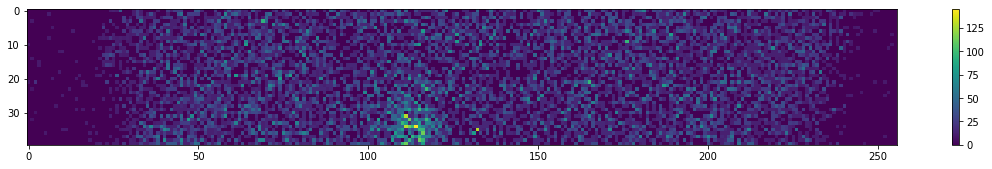

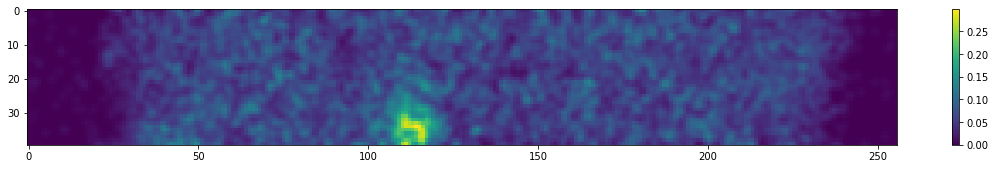

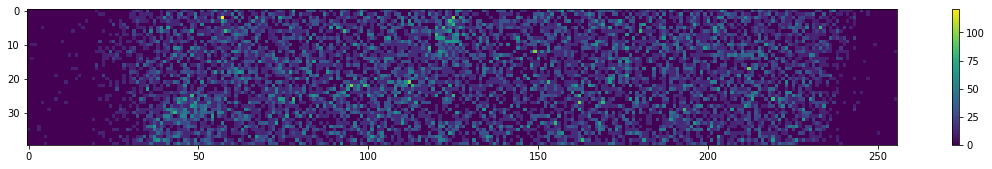

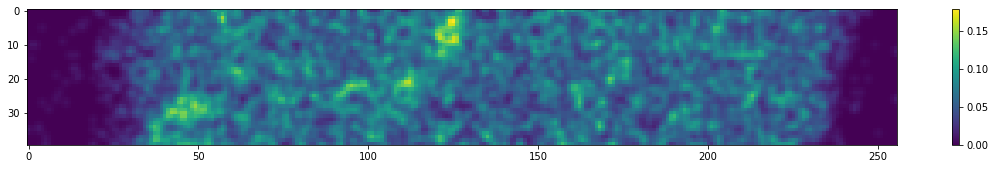

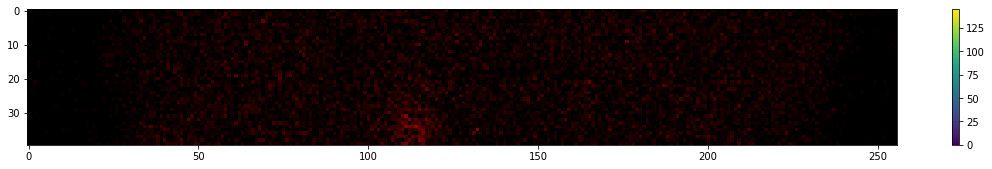

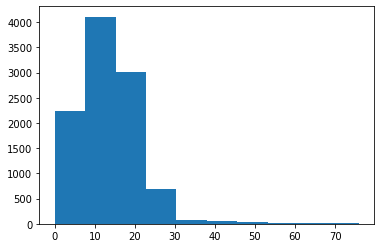

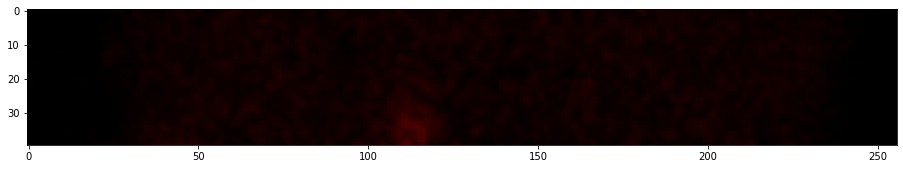

In [25]:
sigma=1

plt.figure(figsize=(20,2.5))
im = cv2.imread(get_image_path(2007))[:, :, 2]
print(im.dtype)
plt.imshow(im)
plt.colorbar()
plt.show()
im = gaussian(im, sigma=sigma)
plt.figure(figsize=(20,2.5))
plt.imshow(im)
plt.colorbar()
plt.show()

plt.figure(figsize=(20,2.5))
im = cv2.imread(get_image_path(1995))[:, :, 2]
plt.imshow(im)
plt.colorbar()
plt.show()
im = gaussian(im, sigma=sigma)
plt.figure(figsize=(20,2.5))
plt.imshow(im)
plt.colorbar()
plt.show()

plt.figure(figsize=(20,2.5))
im = cv2.imread(get_image_path(2007))
plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
plt.colorbar()
plt.show()
im = gaussian(im, sigma=sigma, multichannel=True, preserve_range=True).astype('uint8')
plt.hist(im[:,:,2].reshape(-1,1))
plt.show()

plt.figure(figsize=(20,2.5))
plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
plt.show()

Using the same technique for highlighting the spark but using the gaussian filtered image as input.

[[ 0.          0.         17.83254016]
 [ 0.          0.          9.73057077]
 [ 0.          0.         24.13066254]
 [ 0.          0.         13.47807363]
 [ 0.          0.         27.05338497]
 [ 0.          0.         20.72295434]
 [ 0.          0.         16.        ]
 [ 0.          0.         11.48319579]
 [ 0.          0.          7.73538925]
 [ 0.          0.         15.        ]]


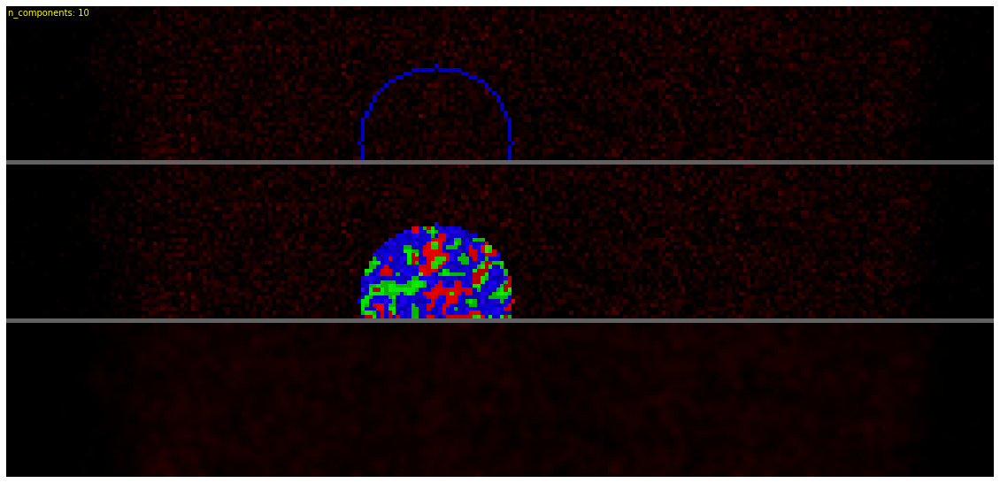

[[ 0.          0.         41.45718523]
 [ 0.          0.         16.98508476]]


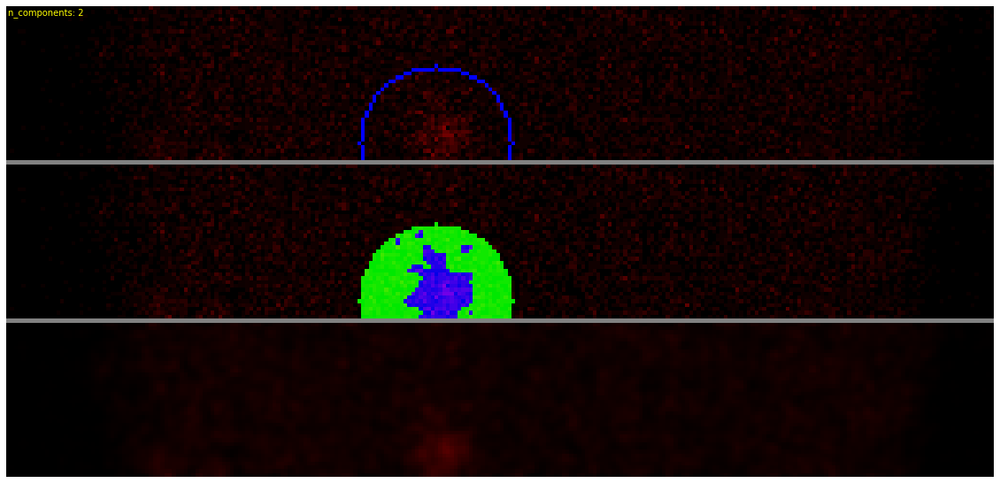

[[ 0.          0.         19.90944499]]


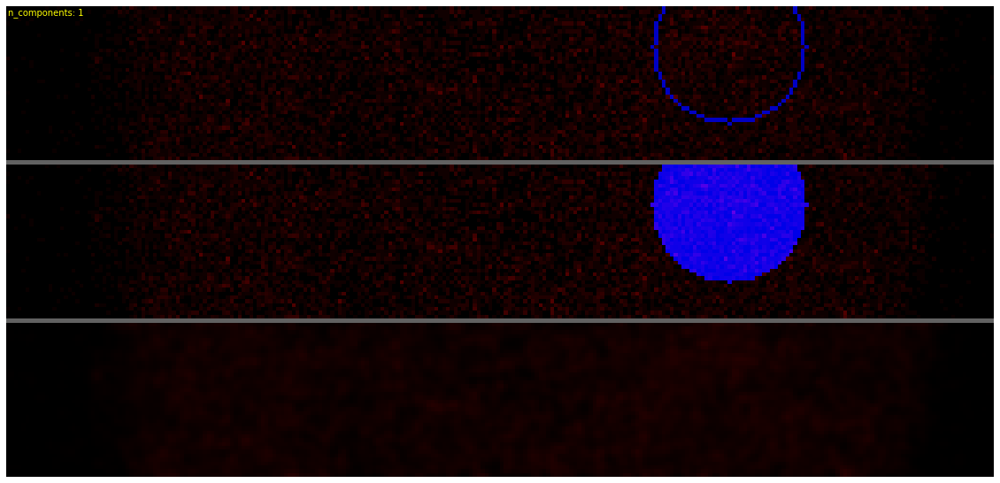

[[ 0.          0.         19.07970505]
 [ 0.          0.         44.52754426]]


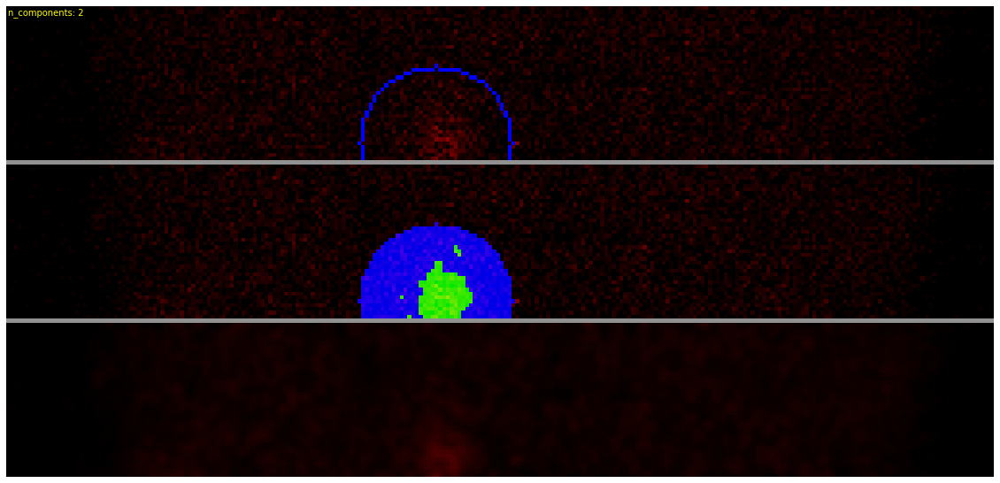

In [26]:
for idx in [2003, 2008, 2269, 2007]:
    im = cv2.imread(get_image_path(idx))
    imOutput = im.copy()
    imFiltered = gaussian(im.copy(), sigma=1, multichannel=True, preserve_range=True).astype('uint8')

    sparkLocations = get_spark_location(sparksDF, idx)
    gmmCounts = []
    # only first one
    i, sparkLocation = next(sparkLocations.iterrows())
    color = int(im.max()*2)

    mask = get_mask(im.shape[0], im.shape[1], sparkLocation['x'], sparkLocation['y'], 20)
    
    nComp, bic = get_optimal_ncomponents_and_bic_gmm(imFiltered[mask].reshape(-1,3), nmin=1, nmax=10)
    nComp = nComp
    gmmCounts.append(nComp)
    gmm = mixture.GaussianMixture(n_components=nComp).fit(imFiltered[mask].reshape(-1,3))
    lab = gmm.predict(imFiltered[mask].reshape(-1,3))
    
    print(gmm.means_)

    maxRValue = imOutput[mask,2].max()
    maxValue = np.array([0, 0, maxRValue]).reshape(-1,3)
    maxValueIdx = imOutput[mask, 2].argmax()
    isSparkCond = np.full(imOutput[mask].shape, False)
    isSparkCond[lab == lab[maxValueIdx], 1] = True
    # imOutput[mask] = np.where(isSparkCond, maxRValue, imOutput[mask])
    imOutput[mask, lab%3]  = 1000 * (lab//3+1)

    cv2.circle(im, (sparkLocation['x'], sparkLocation['y']), 20, color, thickness=1, lineType=8, shift=0)
    conc_im = np.concatenate((im, np.full((1,im.shape[1], 3), maxRValue), imOutput, np.full((1,im.shape[1], 3), maxRValue), imFiltered))
    plt.figure(figsize=(20,10))
    plt.imshow(cv2.cvtColor(conc_im, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    # plt.title(f"{idx}")
    plt.text(0, 0, f"n_components: {', '.join(str(c) for c in gmmCounts)}", c='yellow', verticalalignment='top')
    plt.savefig(f"_out/sparkDetection{idx}_autoGMMnum", bbox_inches = 'tight', pad_inches = 0)
    plt.show()

Now alltoghether detect the frames where spark is actually visible, and highlight the area of the spark using the gaussian filtered image on all frames of a spark.

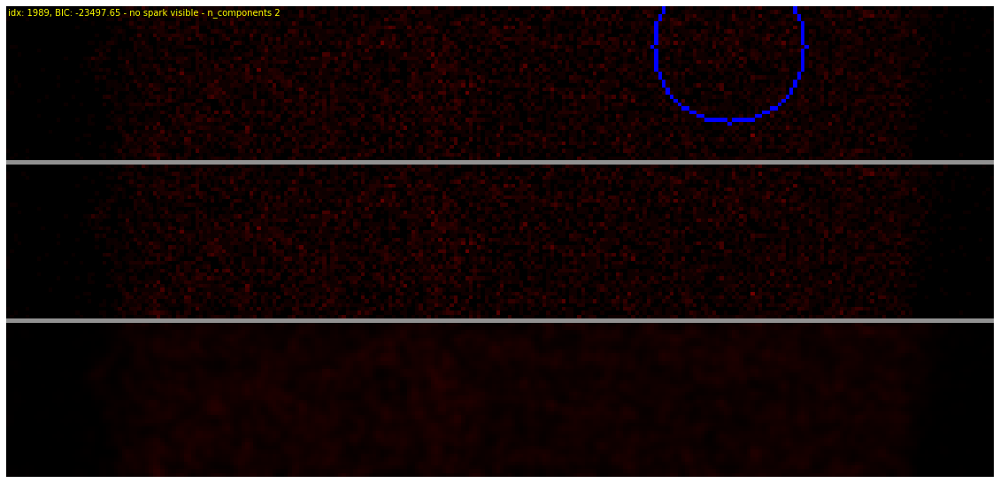

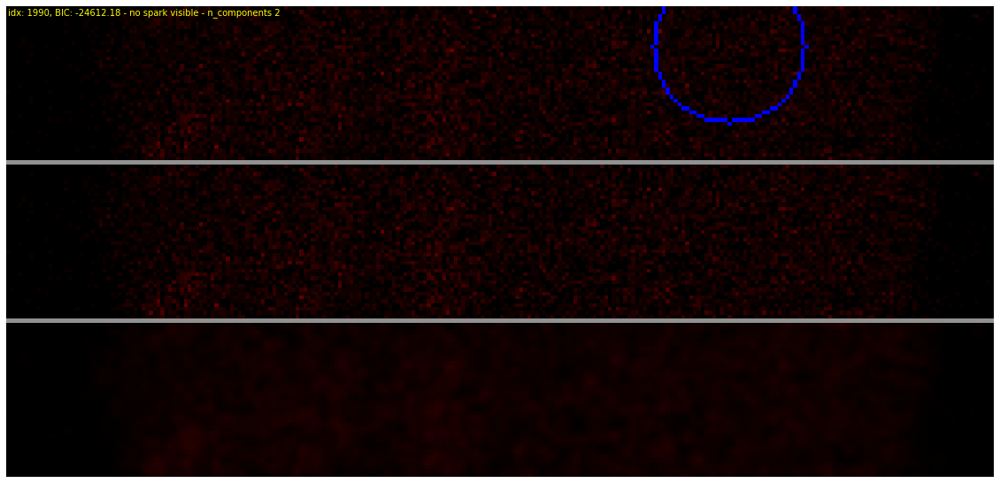

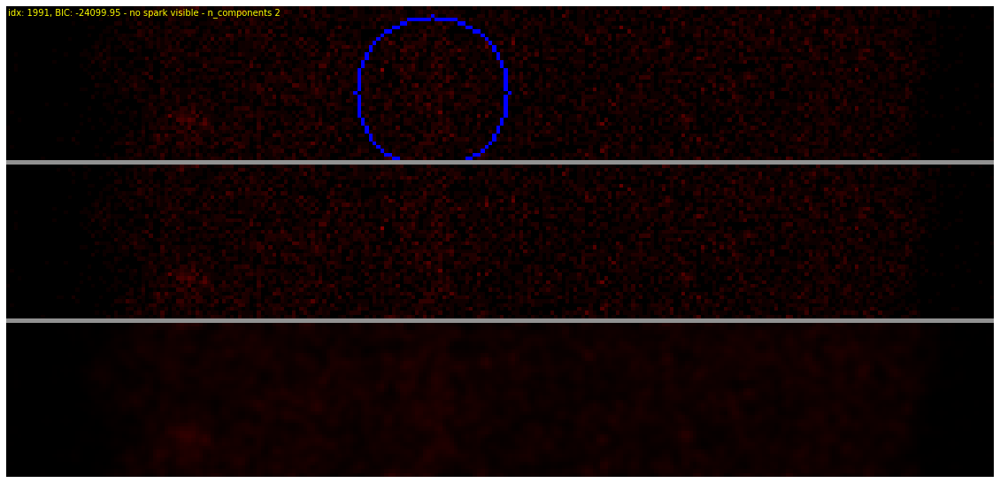

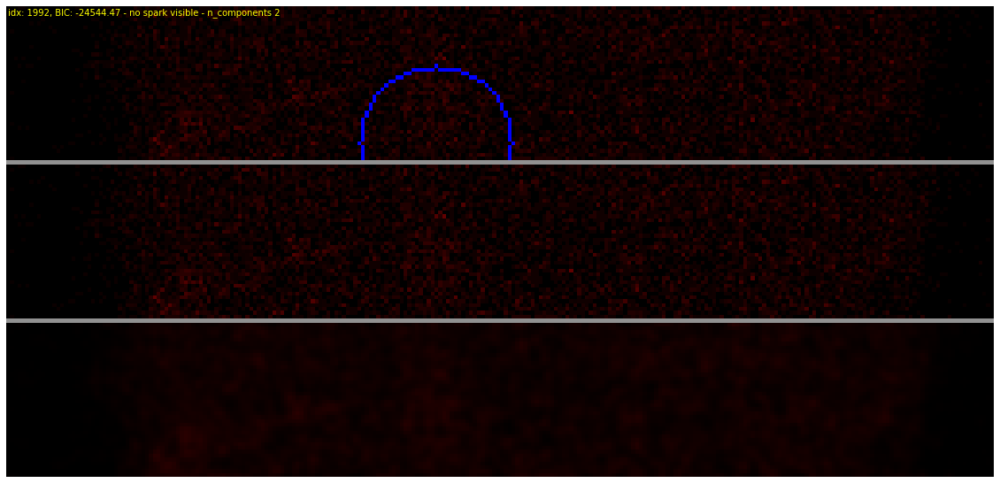

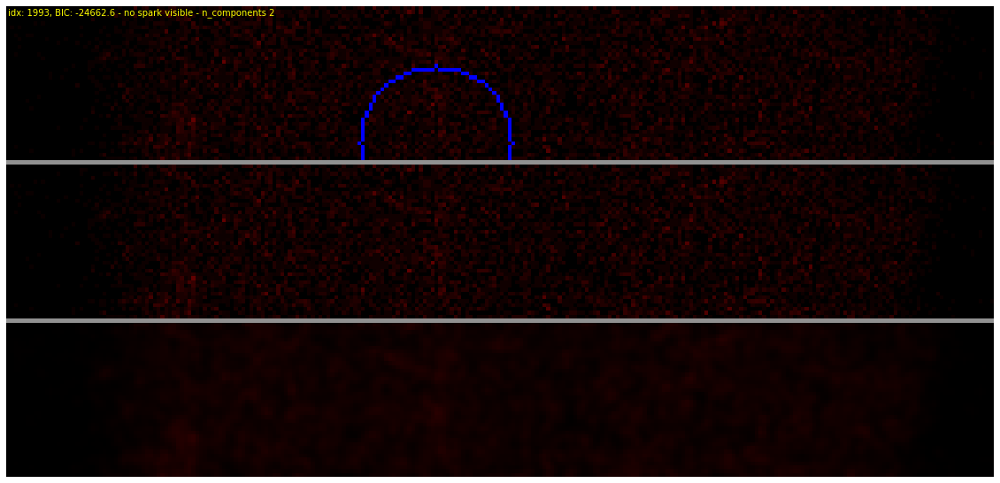

...

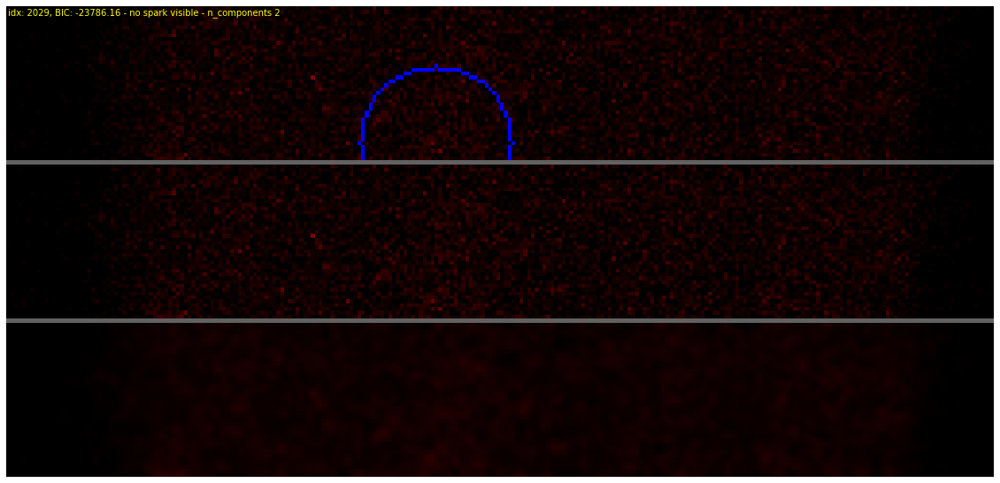

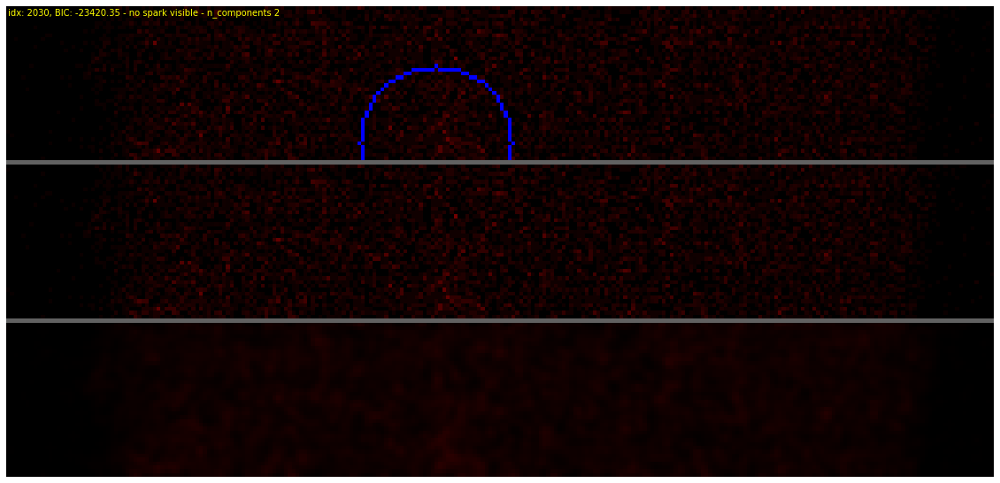

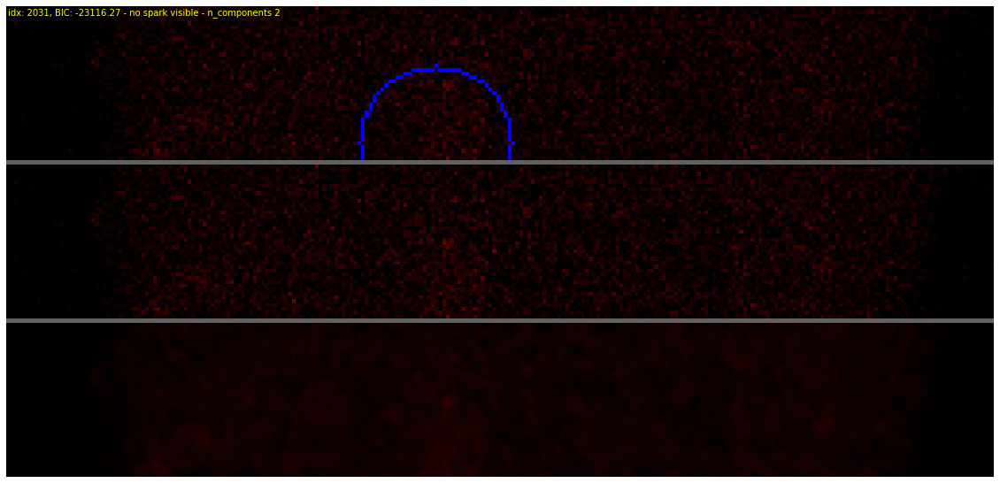

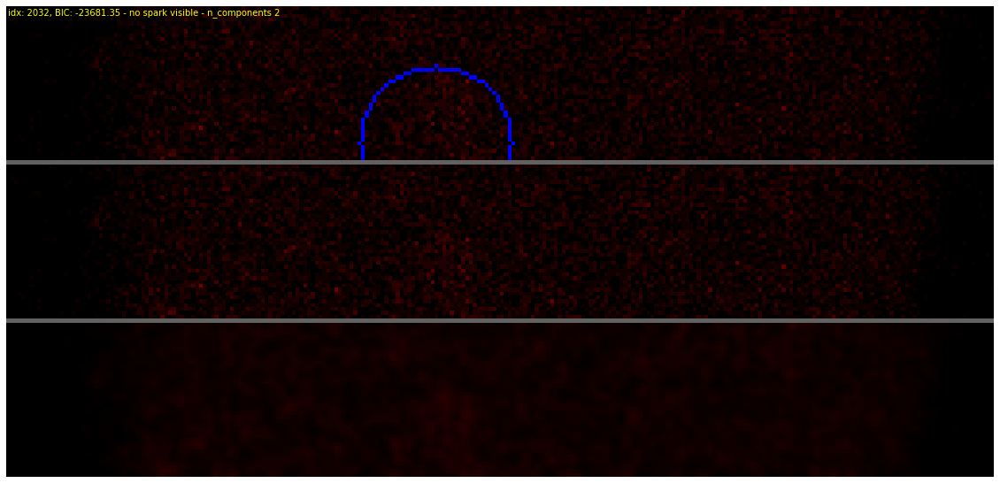

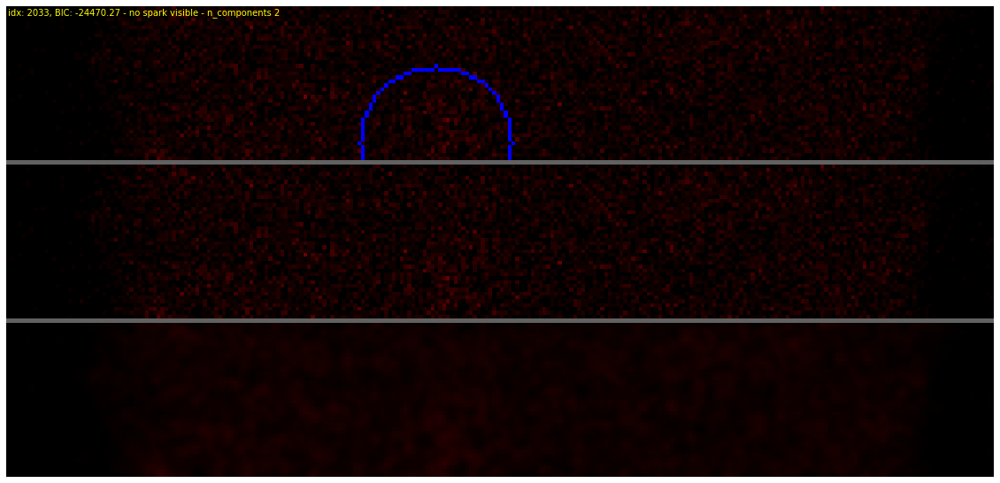

In [27]:
_, sparkS = next(sparksDF.loc[(sparksDF.loc[:, 'tIni']<=2003)&(sparksDF.loc[:, 'tFin']>=2003), :].iterrows())
sparkVisibilityMask = get_spark_visibility_frame_mask(sparkS['tIni'], sparkS['tFin'], sparkS['x'], sparkS['y'])
for j, idx in enumerate(range(sparkS['tIni'], sparkS['tFin'])):
    im = cv2.imread(get_image_path(idx))
    imOutput = im.copy()
    imFiltered = gaussian(im.copy(), sigma=1, multichannel=True, preserve_range=True).astype('uint8')

    sparkLocations = get_spark_location(sparksDF, idx)
    gmmCounts = []
    # only first one
    i, sparkLocation = next(sparkLocations.iterrows())
    
    if sparkVisibilityMask[j]:
        mask = get_mask(im.shape[0], im.shape[1], sparkLocation['x'], sparkLocation['y'], 20) #  & (im[:,:,2]>0)
    
        nComp, bic = get_optimal_ncomponents_and_bic_gmm(imFiltered[mask].reshape(-1,3))
        
        gmm = mixture.GaussianMixture(n_components=nComp).fit(imFiltered[mask].reshape(-1,3))
        lab = gmm.predict(imFiltered[mask].reshape(-1,3))
        probs = gmm.predict_proba(imFiltered[mask].reshape(-1,3))
        mixtIdx = gmm.means_[:, 2].argmax()

        maxRValue = im[mask,2].max()
        maxValue = np.array([0, 0, maxRValue]).reshape(-1,3)
        maxValueIdx = im[mask, 2].argmax()
        isSparkCond = np.full(imOutput[mask].shape, False)
        isSparkCond[lab == mixtIdx, 1] = True # probs[:,mixtIdx]>.8 (amb nCom fixat (2/3)) vs lab == mixtIdx (automatic nComp)
        imOutput[mask] = np.where(isSparkCond, maxRValue, imOutput[mask])
    
    cv2.circle(im, (sparkLocation['x'], sparkLocation['y']), 20, color, thickness=1, lineType=8, shift=0)
    conc_im = np.concatenate((im, np.full((1,im.shape[1], 3), maxRValue), imOutput, np.full((1,im.shape[1], 3), maxRValue), imFiltered))
    plt.figure(figsize=(20,10))
    plt.imshow(cv2.cvtColor(conc_im, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.text(0, 0, f"idx: {idx}, BIC: {round(bics_list[j],2)} - " +\
             f"{'no' if not sparkVisibilityMask[j] else ''} spark visible - " +\
             f"n_components {nComp}" +\
             (f"n #gmms {nComp}" if sparkVisibilityMask[j] else ""), c='yellow', verticalalignment='top')
    # plt.savefig(f"_out/spark_filtered{idx}", bbox_inches = 'tight', pad_inches = 0)
    plt.show()

## Detect spark real presence
### - Clustering over avg pixel value
A custom method based on a gmm clustering over the average value of pixels by frame. This is performed with n_components=2.
(Not very good performance in general)
### - Recommended n_components over filtered image
Based on number of gmms over the filtered gaussian.
If "optimal number of gmms" in {2,3} -> spark visible.
(Best method).
### - Entropy
Computing the entropy of each frame and then applying a gmm with n_components=2.
(Not very good performance).

In [28]:
def get_spark_visibility_frame_mask2(sparkIni, sparkFin, sparkX, sparkY):
    nCompList = []
    for j, idx in enumerate(range(sparkIni, sparkFin)):
        im = cv2.imread(get_image_path(idx))
        imOutput = im.copy()
        imFiltered = gaussian(im.copy(), sigma=1, multichannel=True, preserve_range=True).astype('uint8')
        
        mask = get_mask(im.shape[0], im.shape[1], sparkX, sparkY, 20)
        nComp, bic = get_optimal_ncomponents_and_bic_gmm(imFiltered[mask].reshape(-1,3))
        nCompList.append(nComp)
    nCompList = np.array(nCompList)
    return np.logical_or((nCompList == 2), (nCompList == 3))

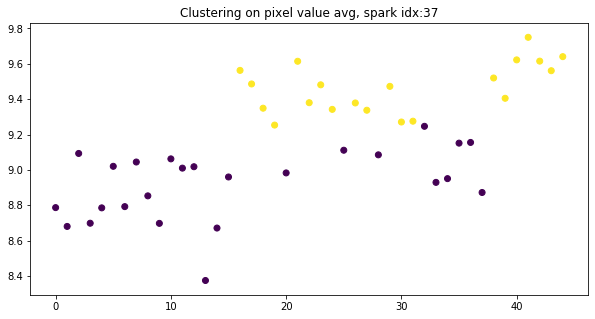

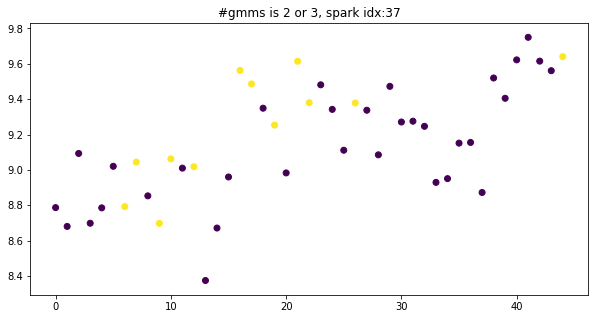

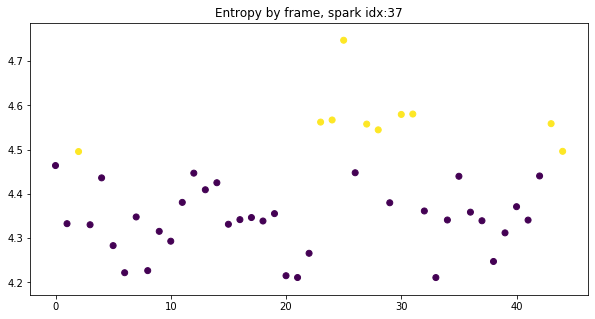

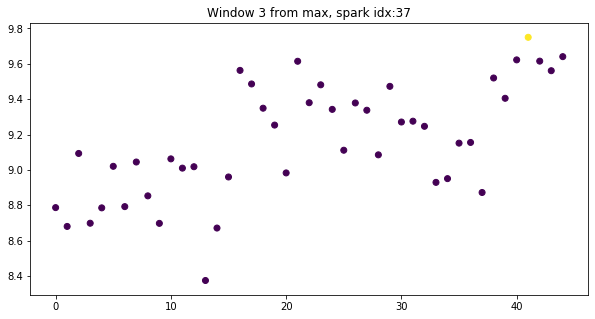

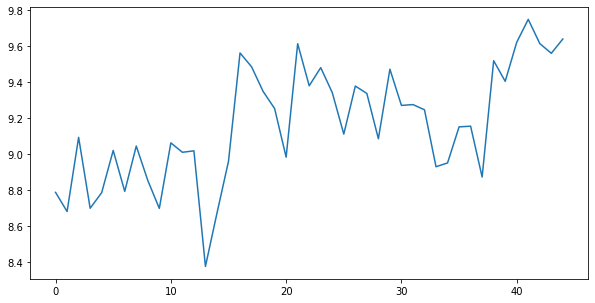

...

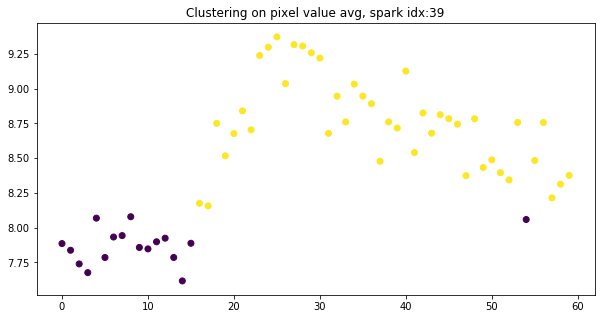

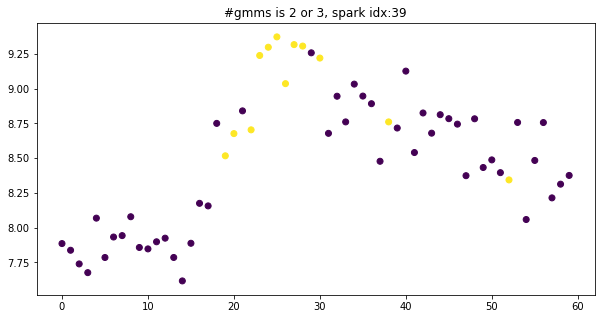

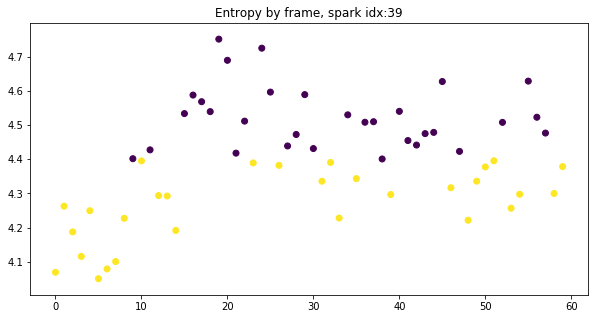

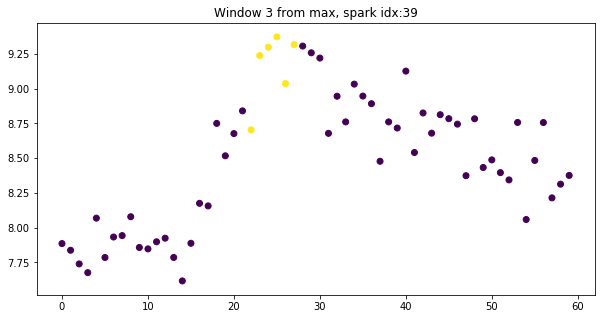

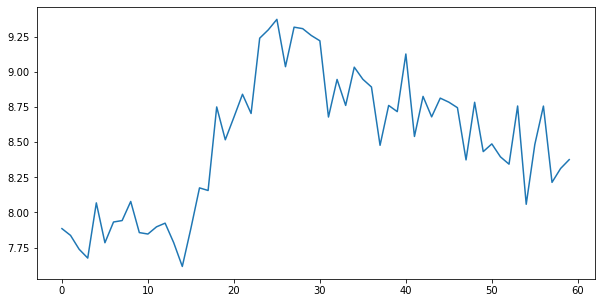

In [43]:
defFigSize = (10,5)

for sidx, sparkS in sparksDF.sample(5).iterrows():
    sparkIni = sparkS['tIni']
    sparkFin = sparkS['tFin']
    sparkX = sparkS['x']
    sparkY = sparkS['y']
    
    # sparkVisibilityMask = get_spark_visibility_frame_mask(sparkIni, sparkFin, sparkX, sparkY)
    meansList = []
    nCompList = []
    entropyList = []
    meansList2 = []
    meansList3 = []
    for j, idx in enumerate(range(sparkIni, sparkFin)):
        im = cv2.imread(get_image_path(idx))
        imOutput = im.copy()
        imFiltered = gaussian(im.copy(), sigma=1, multichannel=True, preserve_range=True).astype('uint8')
        
        mask = get_mask(im.shape[0], im.shape[1], sparkX, sparkY, 20)
        meansList.append(im[mask & (im[:,:,2]>0)].reshape(-1,1).mean())

        nComp, bic = get_optimal_ncomponents_and_bic_gmm(imFiltered[mask].reshape(-1,3))
        nCompList.append(nComp)
        
        e = entropy(imFiltered[:, :, 2], mask)[sparkLocation['y'], sparkLocation['x']]
        entropyList.append(e)
        
        meansList2.append(imFiltered[mask & (im[:,:,2]>0)].reshape(-1,1).mean())
        meansList3.append(imFiltered[mask].reshape(-1,1).mean())
        
    nCompRolled = pd.Series(nCompList).rolling(3, center=True, min_periods=1, win_type='gaussian').mean(std=0.5).round().tolist()
    
    meanGmm = mixture.GaussianMixture(n_components=2).fit(np.array(meansList).reshape(-1, 1))
    lab = meanGmm.predict(np.array(meansList).reshape(-1, 1))

    plt.figure(figsize=defFigSize)
    plt.scatter(x=range(len(meansList)), y=meansList, c=lab)
    plt.title('Clustering on pixel value avg, spark idx:{}'.format(sidx))
    # plt.colorbar()
    # plt.savefig(f"_out/scatter_pixel_value", bbox_inches = 'tight', pad_inches = 0)
    plt.show()
    
    # sparkVisibilityMask2 = get_spark_visibility_frame_mask2(sparkIni, sparkFin, sparkX, sparkY)
    
    plt.figure(figsize=defFigSize)
    plt.scatter(x=range(len(meansList)), y=meansList, c=np.isin(nCompList, [2,3]))
    plt.title('#gmms is 2 or 3, spark idx:{}'.format(sidx))
    # plt.colorbar()
    # plt.savefig(f"_out/scatter_pixel_value", bbox_inches = 'tight', pad_inches = 0)
    plt.show()
    
    gmm = mixture.GaussianMixture(n_components=2).fit(np.array(entropyList).reshape(-1, 1))
    lab = gmm.predict(np.array(entropyList).reshape(-1, 1))
    
    plt.figure(figsize=defFigSize)
    plt.scatter(x=range(len(meansList)), y=entropyList, c=lab)
    plt.title('Entropy by frame, spark idx:{}'.format(sidx))
    # plt.colorbar()
    # plt.savefig(f"_out/scatter_pixel_value", bbox_inches = 'tight', pad_inches = 0)
    plt.show()
    
    # windowed from max pixel value
    newc = np.full((len(meansList),), False)
    sparkWin = 3
    maxSparkIdx = np.argmax(meansList)
    newc[max(maxSparkIdx-3, 0):min(maxSparkIdx+3, len(meansList))] = True
    newc = newc & np.isin(nCompList, [2,3])
    newc[maxSparkIdx] = True
    
    plt.figure(figsize=defFigSize)
    plt.scatter(x=range(len(meansList)), y=meansList, c=newc)
    plt.title('Window {} from max, spark idx:{}'.format(sparkWin, sidx))
    # plt.colorbar()
    # plt.savefig(f"_out/scatter_pixel_value", bbox_inches = 'tight', pad_inches = 0)
    plt.show()
    
    plt.figure(figsize=defFigSize)
    plt.plot(meansList, label='mean with non zero')
    # plt.plot(meansList2, label='filtered mean with non zero')
    # plt.plot(meansList3, label='filtered mean')
    # plt.legend()
    plt.show()
    
    # print(np.corrcoef(meansList, meansList2))
    # print(np.corrcoef(meansList, meansList3))
    # print(np.corrcoef(meansList3, meansList2))
    
#     for j, idx in enumerate(range(sparkIni, sparkFin)):
#         im = cv2.imread(get_image_path(idx))
#         imOutput = im.copy()
#         imFiltered = gaussian(im.copy(), sigma=1, multichannel=True, preserve_range=True).astype('uint8')
# 
#         mask = get_mask(im.shape[0], im.shape[1], sparkX, sparkY, 20) #  & (im[:,:,2]>0)
# 
#         nComp, bic = get_optimal_ncomponents_and_bic_gmm(imFiltered[mask].reshape(-1,3))
# 
#         cv2.circle(im, (sparkX, sparkY), 20, color, thickness=1, lineType=8, shift=0)
#         plt.figure(figsize=(20,5))
#         plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
#         plt.axis('off')
#         plt.text(0, 0, f"idx: {idx} - " +\
#                  f"{'no' if not sparkVisibilityMask[j] else ''} spark visible - " +\
#                  (f"n #gmms {nComp}, rolled {nCompRolled[j]}"), c='yellow', verticalalignment='top')
#         # plt.savefig(f"_out/spark_filtered{idx}", bbox_inches = 'tight', pad_inches = 0)
#         plt.show()

### GMM model with all frames with spark visible

nComponents 10


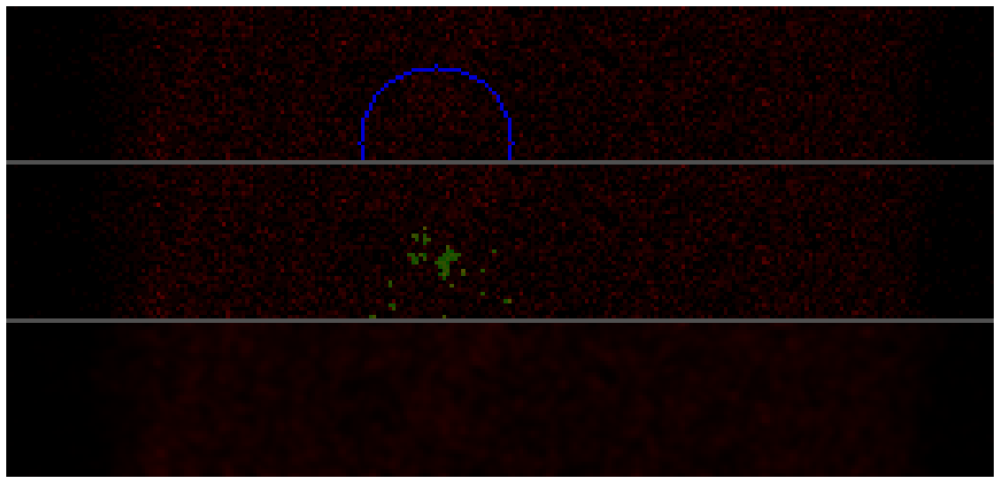

nComponents 5


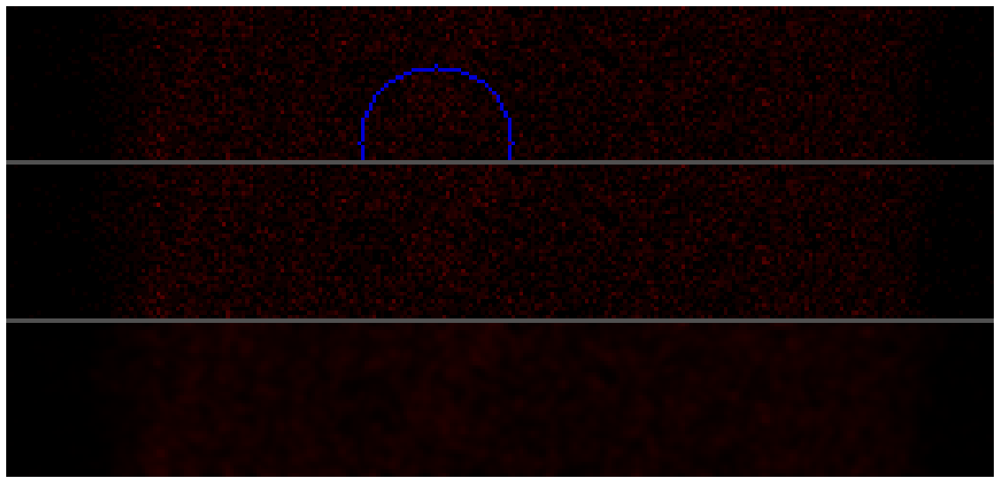

nComponents 2


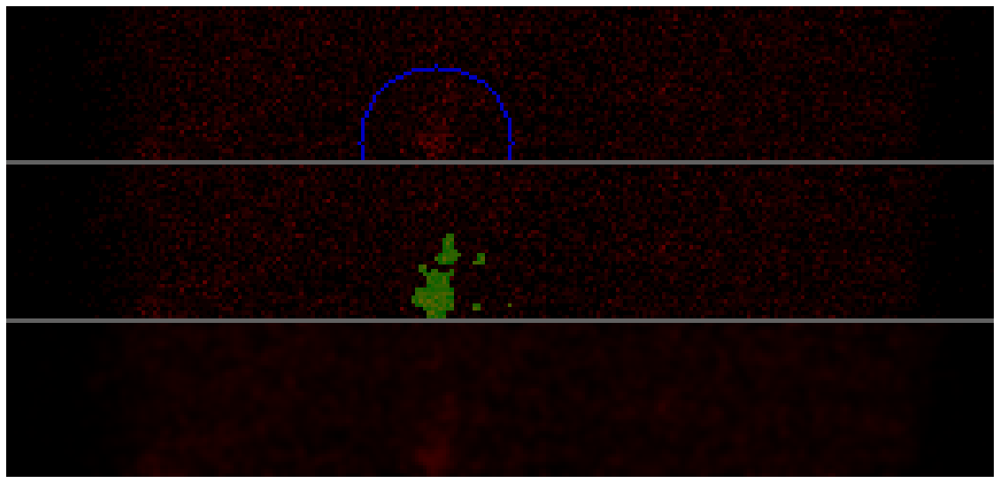

nComponents 5


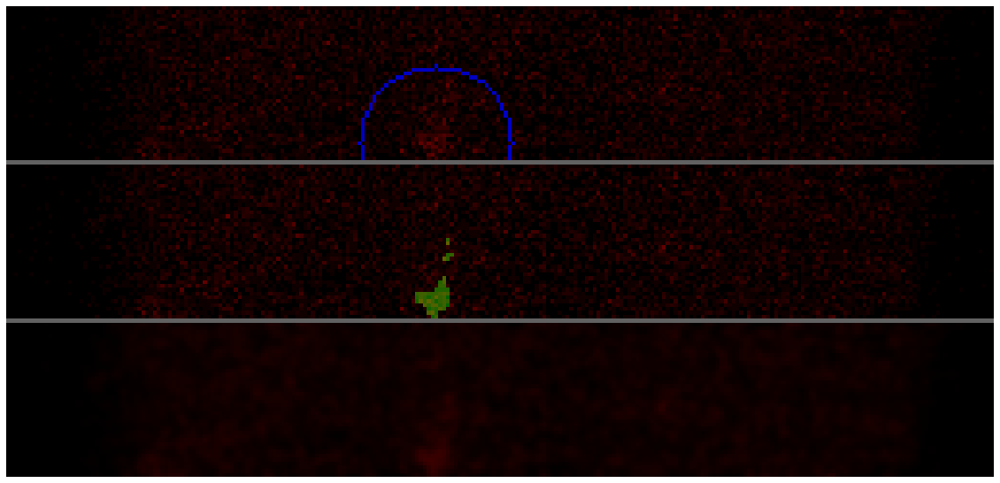

In [35]:
fullSparkPixels = pd.read_csv('fullSparkPixels.csv', delimiter=';', header=None)
fullNComp, bic = get_optimal_ncomponents_and_bic_gmm(fullSparkPixels)
fullGMM = mixture.GaussianMixture(n_components=nComp).fit(fullSparkPixels)

for idx in [2000, 2005]:
    for mode in ['single', 'full']:
        im = cv2.imread(get_image_path(idx))
        imOutput = im.copy()
        imFiltered = gaussian(im.copy(), sigma=1, multichannel=True, preserve_range=True).astype('uint8')

        sparkLocations = get_spark_location(sparksDF, idx)
        gmmCounts = []
        # only first one
        i, sparkLocation = next(sparkLocations.iterrows())

        mask = get_mask(im.shape[0], im.shape[1], sparkLocation['x'], sparkLocation['y'], 20)  # & (im[:,:,2]>0)
        
        if mode != 'full':
            nComp, bic = get_optimal_ncomponents_and_bic_gmm(imFiltered[mask].reshape(-1, 3))
            gmm = mixture.GaussianMixture(n_components=nComp).fit(imFiltered[mask].reshape(-1, 3))
        else:
            gmm = fullGMM
            nComp = fullNComp
            
        print(f"nComponents {nComp}")
            
        lab = gmm.predict(imFiltered[mask].reshape(-1, 3))
        probs = gmm.predict_proba(imFiltered[mask].reshape(-1, 3))
        mixtIdx = gmm.means_[:, 2].argmax()

        maxRValue = im[mask, 2].max()
        maxValue = np.array([0, 0, maxRValue]).reshape(-1, 3)
        maxValueIdx = im[mask, 2].argmax()
        isSparkCond = np.full(imOutput[mask].shape, False)
        isSparkCond[
            lab == mixtIdx, 1] = True  # probs[:,mixtIdx]>.8 (amb nCom fixat (2/3)) vs lab == mixtIdx (automatic nComp)
        imOutput[mask] = np.where(isSparkCond, maxRValue, imOutput[mask])

        color = int(im.max() * 2)
        cv2.circle(im, (sparkLocation['x'], sparkLocation['y']), 20, color, thickness=1, lineType=8, shift=0)
        conc_im = np.concatenate(
            (im, np.full((1, im.shape[1], 3), maxRValue), imOutput, np.full((1, im.shape[1], 3), maxRValue), imFiltered))
        plt.figure(figsize=(20, 10))
        plt.imshow(cv2.cvtColor(conc_im, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

## Plot all traces

In [85]:
from pred.utils import SparkPredictor

sparkPredictor = SparkPredictor(imageId='170215_RyR-GFP30_RO_01_Serie2_SPARKS-calcium', model='pred/i3_comp_2021-01-23_02-02-14_gen_images_ep10_b64_ler0.01_ite0.h5')
Y_pred = sparkPredictor.predict()

In [86]:
imageReader = sparkPredictor.get_image_reader()
images = imageReader.get_full_images()
superMask = imageReader.get_full_sparks_flattened_supermask(images)
fullBaseline = images[:, :, :, 2].flatten()[~superMask].mean()
fullBaseline

12.423260544547945

In [136]:
list(sparksDF.loc[:2-1, :].iterrows())

[(0,
  x       71
  y       36
  tIni     2
  tFin    37
  Name: 0, dtype: uint16),
 (1,
  x       76
  y       37
  tIni    37
  tFin    77
  Name: 1, dtype: uint16)]

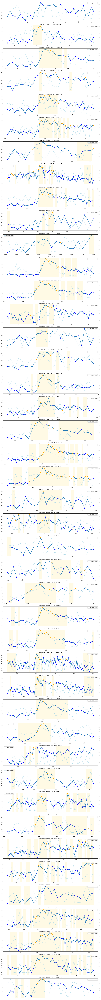

In [146]:
import matplotlib.cm as cm

defFigSize = (20,5)
nPlots = len(sparksDF)
fig, ax = plt.subplots(nPlots, 1, figsize=(defFigSize[0], defFigSize[1]*nPlots))

for sidx, sparkS in sparksDF.loc[:nPlots-1, :].iterrows():
    sparkIni = sparkS['tIni']
    sparkFin = sparkS['tFin']
    sparkX = sparkS['x']
    sparkY = sparkS['y']
    
    meansList = []
    nCompList = []
    relativeAvgToBaseline = []
    maxGmmMeans = []
    relativeMaxMinGmmMeans = []
    relativeMaxBaselineGmmMean = []
    for j, idx in enumerate(range(sparkIni, sparkFin)):
        im = cv2.imread(get_image_path(idx))
        imOutput = im.copy()
        imFiltered = gaussian(im.copy(), sigma=1, multichannel=True, preserve_range=True).astype('uint8')
        
        mask = get_mask(im.shape[0], im.shape[1], sparkX, sparkY, 20)
        m = im[mask & (im[:,:,2]>0)][:, 2].reshape(-1,1).mean()
        meansList.append(m)
        relativeAvgToBaseline.append((m-fullBaseline)/m)
        
        data = imFiltered[mask].reshape(-1,3)
        nComp, bic = get_optimal_ncomponents_and_bic_gmm(data)
        nCompList.append(nComp)
        gmm = mixture.GaussianMixture(n_components=nComp).fit(data)
        
        maxGmmMeans.append(gmm.means_[:, 2].max())
        relativeMaxMinGmmMeans.append(gmm.means_[:, 2].max()/gmm.means_[:, 2].min())
        relativeMaxBaselineGmmMean.append(gmm.means_[:, 2].max()/fullBaseline)
    
    ax1 = ax[sidx] if nPlots > 1 else ax
    ax1.title.set_text(f'spark idx:{sidx}, location: {sparkX, sparkY}, duration: {sparkFin-sparkIni}')
    
    for pidx, p in enumerate(Y_pred[sparkIni:sparkFin]):
        if p:
            xaxisVal = pidx+sparkIni
            ax1.axvspan(xaxisVal-0.5, xaxisVal+0.5, alpha=0.1, facecolor='gold')
    
    classColor = ['orange' if nc in [2,3] else 'blue' for nc in nCompList]
    ax1.scatter(x=range(sparkIni, sparkFin), y=meansList, s=100, c=classColor)
    ax1.plot(range(sparkIni, sparkFin), meansList, label='pixel mean', linewidth=3)
    
    ax2 = ax1.twinx()
    # ax2.plot(range(sparkIni, sparkFin), relativeAvgToBaseline, 'lightcoral', label='relative mean to baseline') # es comenta pq el dibuix es calcat a l'anterior
    ax2.plot(range(sparkIni, sparkFin), maxGmmMeans, label='max gmm mean', c='lightblue')
    # ax2.plot(range(sparkIni, sparkFin), relativeMaxMinGmmMeans, label='max/min mean gmms', c='sandybrown')
    # ax2.plot(range(sparkIni, sparkFin), relativeMaxBaselineGmmMean, label='max/fullBaseline mean gmms', c='gold')
    
    ax2.legend()
plt.savefig('allTraces_pred.pdf', bbox_inches='tight')
plt.show()

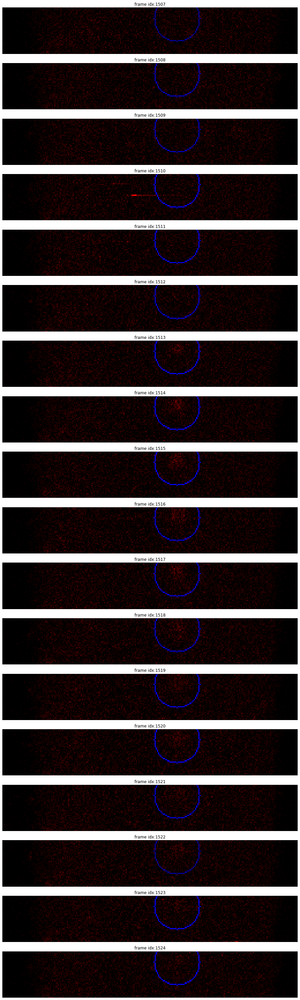

In [170]:
import matplotlib.cm as cm

defFigSize = (20,3)
imIni, imFin = 1507, 1525
fms = list(range(imIni, imFin))
nPlots = len(fms)
fig, ax = plt.subplots(nPlots, 1, figsize=(defFigSize[0], defFigSize[1]*nPlots))

for imidx in fms:
    im = imageReader.get_full_images()[imidx]
    sparkLocations = get_spark_location(sparksDF, imidx)
    for i, sparkLocation in sparkLocations.iterrows():
        color = int(im.max() * 2)
        cv2.circle(im, (sparkLocation['x'], sparkLocation['y']), 20, color, thickness=1, lineType=8, shift=0)
    
    ax1 = ax[imidx-imIni] if nPlots > 1 else ax
    ax1.title.set_text(f'frame idx:{imidx}')
    ax1.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
    ax1.axis('off')
    
plt.savefig(f'_out/performance_evaluation/2021-02-16/frames{imIni}-{imFin}.pdf', bbox_inches='tight')
plt.show()

## Normaization 
$F_0 = mean(F \in cell | \forall frames)$  
$F_n = \frac{F-F_0}{F_0}$

### Build cell mask

In [24]:
BACKGROUND_MAX_VALUE = 0

cellMask = np.zeros(get_image_array(0).shape)
for i in range(len(imageList)):
    im1 = get_image_array(i)
    auxMask = im1 > BACKGROUND_MAX_VALUE
    cellMask += auxMask

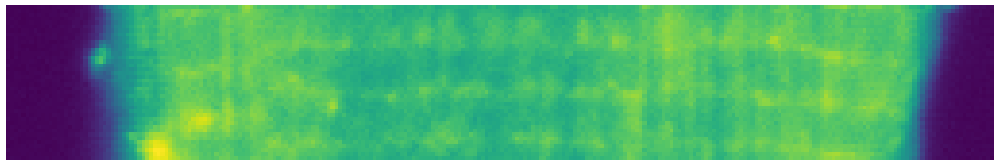

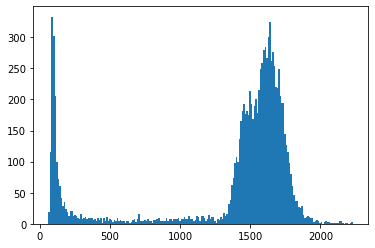

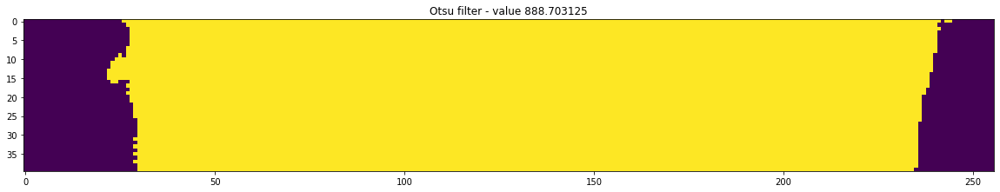

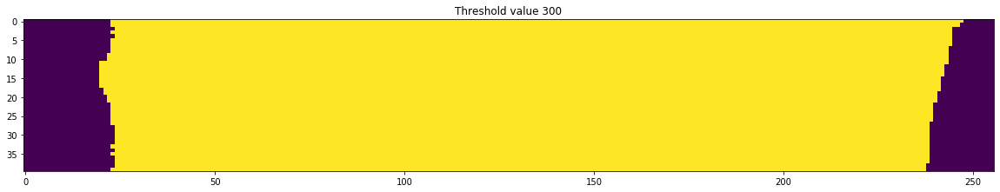

In [25]:
# cellMask = im1 > BACKGROUND_MAX_VALUE
plt.figure(figsize=(20, 10))
plt.imshow(cellMask)
plt.axis('off')
# plt.savefig(f"_out/cellmask", bbox_inches = 'tight', pad_inches = 0)
plt.show()


plt.hist(cellMask.flatten(), bins=200)
plt.show()

plt.figure(figsize=(20, 10))
thr = threshold_otsu(cellMask)
plt.imshow(cellMask > thr)
plt.title(f'Otsu filter - value {thr}')
plt.show()

plt.figure(figsize=(20, 10))
thr = 300
plt.imshow(cellMask > thr)
plt.title(f'Threshold value {thr}')
plt.show()

In [26]:
cellMask = cellMask > threshold_otsu(cellMask)

### Value counts

In [27]:
res = pd.Series(dtype='int')
for i in range(len(imageList)):
    im1 = get_image_array(i)
    s1 = pd.Series(im1[cellMask].flatten())
    g1 = s1.groupby(s1).size()
    
    res = pd.concat([res, g1], axis=1).fillna(0, downcast='infer').sum(axis=1)

# res

### F0

In [28]:
F0 = (res*res.index).sum()/res.sum()
F0

15.179870023905599

In [29]:
F0, maxValue, cellMask = get_f0_and_cellmask()

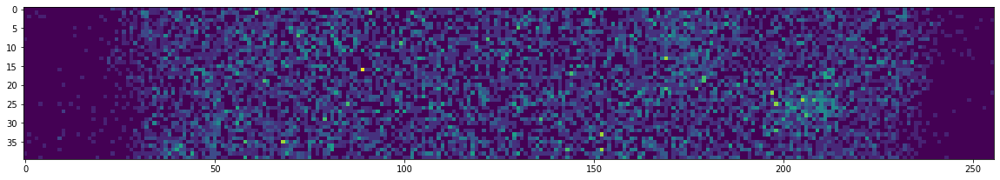

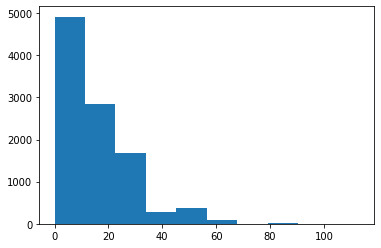

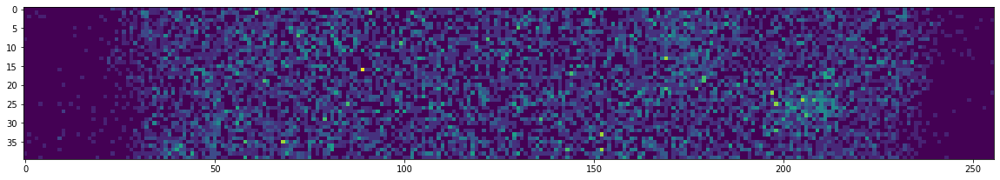

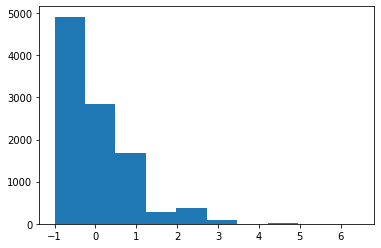

In [30]:
idx = 130
im = get_image_array(idx)

plt.figure(figsize=(20, 10))
plt.imshow(im)
plt.show()

plt.hist(im.flatten())
plt.show()

im = get_normalized_frame(im, F0)

plt.figure(figsize=(20, 10))
plt.imshow(im)
plt.show()

plt.hist(im.flatten())
plt.show()